In [1]:
import json
import re
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import numpy as np
from pathlib import Path
from scipy.stats import ttest_rel
from matplotlib import cm
import matplotlib.ticker as ticker

In [2]:
%matplotlib inline
sns.set_theme(style="whitegrid")

In [3]:
def load_bss_data(json_path):
    with open(json_path, 'r') as f:
        data = json.load(f)
    
    prompt_rows, stats_rows = [], []
    for entry in data:
        drift_lvl = entry.get("Drift_Level")
        
        scores = entry.get("Scores", {})
        for key, bss_val in scores.items():
            parts = key.split(" (")
            prompt_name = parts[0]
            category = parts[1].replace(")", "")
            prompt_rows.append({
                "Drift": drift_lvl, "Category": category, "Prompt": prompt_name,
                "BSS": bss_val, "Prompt_Num": int(re.search(r'\d+', prompt_name).group())
            })
            
        stats = entry.get("Category_Stats", {})
        for cat, stat_val in stats.items():
            var_float = float(stat_val["Variance"].strip('%')) / 100
            stats_rows.append({
                "Drift": drift_lvl, "Category": cat,
                "Mean_BSS": stat_val["Mean"], "Variance": var_float
            })
    return pd.DataFrame(prompt_rows), pd.DataFrame(stats_rows)


In [4]:
def plot_stability_and_instability(df_stats, model_name):
    """1 & 2. Stability and Instability (Log Scale) with Grid Lines."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Mean BSS View
    sns.lineplot(data=df_stats, x="Drift", y="Mean_BSS", hue="Category", marker="o", ax=ax1)
    ax1.set_title(f"Mean BSS Trend: {model_name}")
    ax1.set_xticks([1, 2, 3, 4, 5])
    ax1.grid(True, which='both', linestyle='--', alpha=0.7)
    
    # Instability View (Log Scale)
    sns.lineplot(data=df_stats, x="Drift", y="Variance", hue="Category", marker="s", ax=ax2)
    ax2.set_yscale('log') 
    ax2.set_title(f"Instability (Log Scale): {model_name}")
    ax2.set_xticks([1, 2, 3, 4, 5])
    ax2.grid(True, which='both', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()

In [5]:
def plot_bss_box_plots(df_prompts, model_name):
    """
    3. Category-first Box Plots with Forced Linear Scaling.
    Guarantees a full 0 to Max scale with no 'jumps'.
    """
    plt.figure(figsize=(16, 8))
    
    # --- Step 1: Plot ---
    sns.boxplot(
        data=df_prompts, 
        x="Category", 
        y="BSS", 
        hue="Drift", 
        palette="deep",
        showfliers=True,
        whis=1.5
    )
    
    # --- Step 2: Force the Linear Scale ---
    # Find the maximum value to ensure the axis goes high enough
    # actual_max = df_prompts['BSS'].max()
    # y_limit = max(1.2, actual_max + 0.1)
    
    # Set the limits explicitly
    # plt.ylim(0, y_limit)
    
    # Force ticks at every 0.1 interval from 0.0 to the limit
    # This prevents the 'jump' from 0 to 0.6
    # ticks = np.arange(0, y_limit + 0.1, 0.1)
    # plt.yticks(ticks)
    
    # --- Step 3: Formatting ---
    plt.axhline(1.0, color='red', linestyle='--', alpha=0.6, label="Ideal Stability")
    plt.title(f"BSS Stability Distribution by Category: {model_name}", fontsize=15, pad=15)
    
    # Make sure grid lines align with our new 0.1 ticks
    plt.grid(True, axis='y', linestyle='--', alpha=0.4)
    plt.ylabel("BSS Score")
    plt.xlabel("Task Category")
    
    # Legend at the bottom
    plt.legend(title="Drift Level", bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=6)
    
    plt.tight_layout()
    plt.show()

In [6]:
def plot_bss_bar_grid_by_category(df_prompts, model_name):
    """4. Bar charts grouped by Category with Dynamic Whisker-based Y-axis."""
    categories = sorted(df_prompts['Category'].unique())
    fig, axes = plt.subplots(2, 2, figsize=(20, 12))
    axes = axes.flatten()
    
    # --- Step 1: Calculate Global Dynamic Y-Limits ---
    # We use the standard whisker logic: Q1 - 1.5*IQR and Q3 + 1.5*IQR
    q1 = df_prompts['BSS'].quantile(0.25)
    q3 = df_prompts['BSS'].quantile(0.75)
    iqr = q3 - q1
    
    # Calculate bounds
    whisker_min = q1 - (1.5 * iqr)
    whisker_max = q3 + (1.5 * iqr)
    
    # Add a small buffer (e.g., 0.1) for visual breathing room
    # Ensure min doesn't go below 0 since BSS is a ratio
    y_min = max(0, whisker_min - 0.1)
    y_max = whisker_max + 0.1
    
    print(f"  [INFO] Setting dynamic Y-axis range: {y_min:.2f} to {y_max:.2f}")

    for i, cat in enumerate(categories):
        subset = df_prompts[df_prompts['Category'] == cat].sort_values("Prompt_Num")
        
        # We use sns.barplot
        sns.barplot(data=subset, x="Prompt", y="BSS", hue="Drift", ax=axes[i], palette="husl")
        
        # Apply the calculated limits
        axes[i].set_ylim(y_min, y_max)
        
        axes[i].set_title(f"Category: {cat.upper()}", fontweight='bold')
        axes[i].tick_params(axis='x', rotation=45)
        
        # Add the ideal stability line
        axes[i].axhline(1.0, color='black', linestyle='--', linewidth=1.5, label="Ideal (1.0)")
        
        axes[i].grid(True, axis='y', linestyle='--', alpha=0.5)
        axes[i].get_legend().remove() 
        
    # Add a single legend for the whole figure at the bottom
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=5, title="Drift Level", bbox_to_anchor=(0.5, 0.02))
    
    plt.suptitle(f"Prompt Performance by Category (Dynamic Scaling): {model_name}", fontsize=18, y=1.02)
    plt.tight_layout(rect=[0, 0.05, 1, 0.95]) 
    plt.show()

In [7]:
def plot_bss_heatmaps(df_prompts, model_name):
    """
    5. Performance Grid Heatmap with Custom Stability Color Coding.
    Green = 1.0 (Ideal)
    Red = < 1.0 (Degradation)
    Purple/Blue = > 1.0 (Outliers/Spikes)
    """
    categories = sorted(df_prompts['Category'].unique())
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    axes = axes.flatten()
    
    # Create a custom colormap: Red (0.0) -> Yellow (0.5) -> Green (1.0) -> Blue/Purple (2.0+)
    # This ensures 1.0 is the 'Green' anchor point.
    colors = ["#d73027", "#fee08b", "#1a9850", "#673ab7"] 
    nodes = [0.0, 0.4, 0.5, 1.0] # Mapping values to colors (0.5 is 1.0 when center=1.0)
    custom_map = LinearSegmentedColormap.from_list("stability_map", list(zip(nodes, colors)))

    for i, cat in enumerate(categories):
        subset = df_prompts[df_prompts['Category'] == cat]
        pivot_df = subset.pivot_table(index="Prompt", columns="Drift", values="BSS")
        
        # Numeric Sort for Y-axis (Prompt 1 to 10)
        pivot_df['temp_sort'] = pivot_df.index.str.extract('(\d+)').astype(int).values
        pivot_df = pivot_df.sort_values('temp_sort').drop(columns='temp_sort')
        
        # vmin/vmax set to 0.5 and 1.5 to make the 'Green' at 1.0 pop.
        # Robust outliers (>2.0) will simply saturate at the dark purple end.
        sns.heatmap(
            pivot_df, 
            annot=True, 
            cmap=custom_map, 
            center=1.0, 
            vmin=0.5, 
            vmax=1.5, 
            fmt=".2f", 
            ax=axes[i],
            linewidths=0.5,
            linecolor='gray'
        )
        axes[i].set_title(f"BSS Heatmap: {cat.upper()}", fontweight='bold', fontsize=14)
        axes[i].set_xlabel("Drift Level")
        axes[i].set_ylabel("Prompt Name")
        
    plt.suptitle(f"Behavioral Stability Heatmaps (Green=Ideal 1.0): {model_name}", fontsize=20, y=1.02)
    plt.tight_layout()
    plt.show()

<>:23: SyntaxWarning: invalid escape sequence '\d'
<>:23: SyntaxWarning: invalid escape sequence '\d'
C:\Users\nitin\AppData\Local\Temp\ipykernel_5236\2182828697.py:23: SyntaxWarning: invalid escape sequence '\d'
  pivot_df['temp_sort'] = pivot_df.index.str.extract('(\d+)').astype(int).values


In [8]:

def plot_bss_heatmaps(df_prompts, model_name):
    """5. Performance Grid Heatmap with Custom Color Logic for BSS."""
    categories = sorted(df_prompts['Category'].unique())
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    # Define custom color segments: [Value, Color]
    # We normalize these between 0 and 1 for the LinearSegmentedColormap
    # Red (0) -> Yellow (0.5) -> Green (1.0/Ideal) -> Dark Green (1.2) -> Purple (Outlier)
    colors = [
        (0.0, "red"),          # Critical drop
        (0.5, "yellow"),       # Significant drift
        (0.8, "#90EE90"),      # Light Green (Near ideal)
        (1.0, "#008000"),      # Green (Ideal)
        (1.2, "#004d00"),      # Dark Green (Slightly above)
        (1.5, "#4B0082"),      # Indigo/Purple (High Outlier)
        (1.0, "black")         # Extreme Outliers
    ]
    
    # Create the colormap. We use a wide range to ensure 1.0 is the visual 'Green' anchor.
    # We clip the heatmap data visualization range from 0.4 to 1.6 for best contrast.
    custom_cmap = mcolors.LinearSegmentedColormap.from_list("BSS_Custom", 
        ["red", "yellow", "#90EE90", "green", "#004d00", "indigo", "black"])

    for i, cat in enumerate(categories):
        subset = df_prompts[df_prompts['Category'] == cat]
        pivot_df = subset.pivot_table(index="Prompt", columns="Drift", values="BSS")
        
        # Numeric Sort for Y-axis
        pivot_df['temp_sort'] = pivot_df.index.str.extract('(\d+)').astype(int).values
        pivot_df = pivot_df.sort_values('temp_sort').drop(columns='temp_sort')
        
        # We set vmin/vmax and center to lock 1.0 to the 'Green' part of our map
        sns.heatmap(
            pivot_df, 
            annot=True, 
            cmap=custom_cmap, 
            center=1.0, 
            vmin=0.4, 
            vmax=1.6, 
            fmt=".2f", 
            ax=axes[i],
            cbar_kws={'label': 'Stability Score (1.0 = Ideal)'}
        )
        axes[i].set_title(f"BSS Heatmap: {cat.upper()}", fontweight='bold')
        axes[i].grid(True) # Heatmaps usually look better without internal grid lines
        
    plt.suptitle(f"Behavioral Stability Heatmaps: {model_name}", fontsize=20, y=1.02)
    plt.tight_layout()
    plt.show()

<>:30: SyntaxWarning: invalid escape sequence '\d'
<>:30: SyntaxWarning: invalid escape sequence '\d'
C:\Users\nitin\AppData\Local\Temp\ipykernel_5236\3018498710.py:30: SyntaxWarning: invalid escape sequence '\d'
  pivot_df['temp_sort'] = pivot_df.index.str.extract('(\d+)').astype(int).values


In [9]:
def run_bss_visualizations(base_bss_dir):
    base_path = Path(base_bss_dir)
    for json_file in base_path.glob("**/bss_scores_with_stats.json"):
        model_name = json_file.parent.name
        print(f"\n{'='*80}\nBSS EVALUATION REPORT: {model_name}\n{'='*80}")
        
        df_prompts, df_stats = load_bss_data(json_file)
        if df_prompts.empty: continue
            
        plot_stability_and_instability(df_stats, model_name)
        plot_bss_box_plots(df_prompts, model_name)
        plot_bss_bar_grid_by_category(df_prompts, model_name)
        plot_bss_heatmaps(df_prompts, model_name)


BSS EVALUATION REPORT: Meta-Llama-3-8B-Instruct_4bit


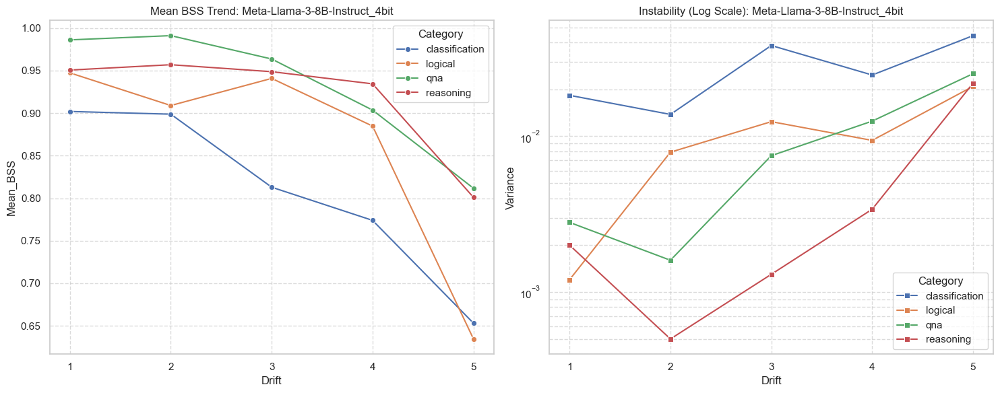

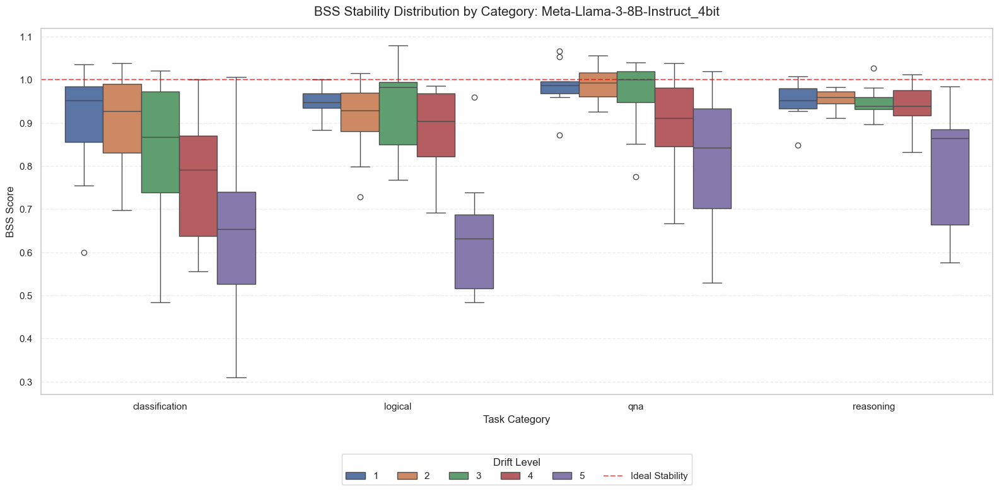

  [INFO] Setting dynamic Y-axis range: 0.47 to 1.33


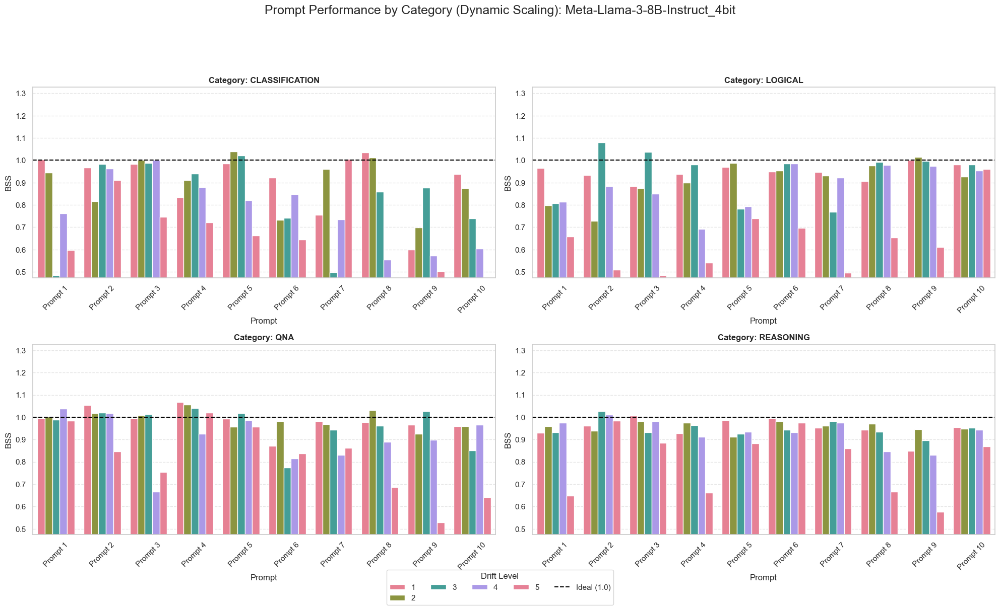

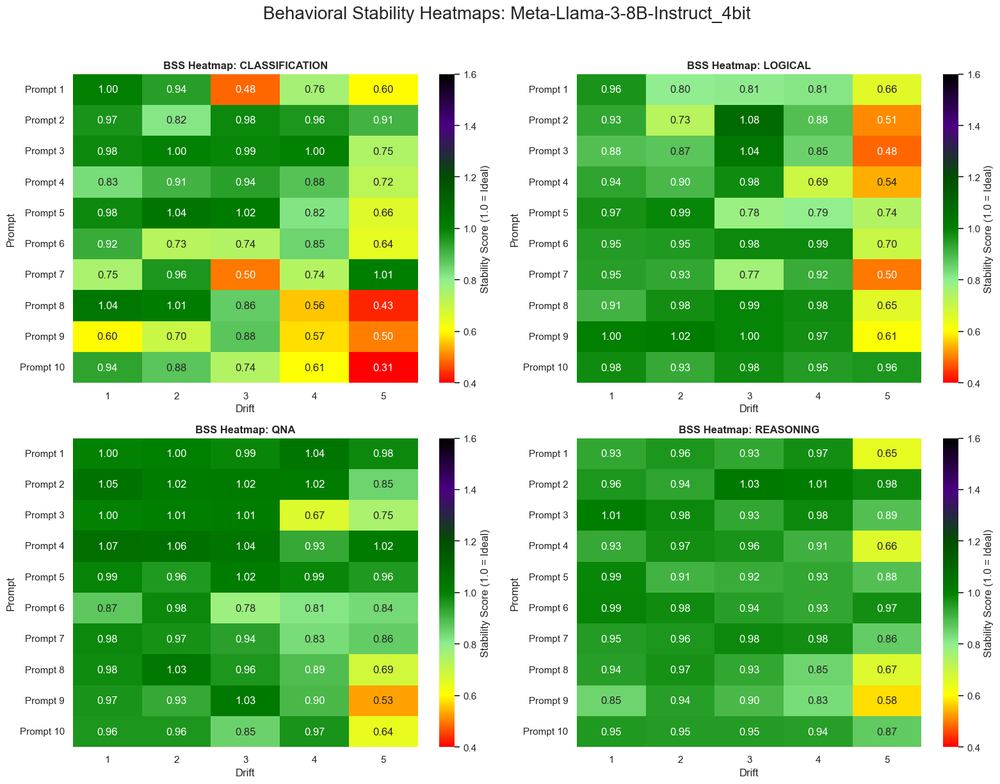


BSS EVALUATION REPORT: Meta-Llama-3-8B-Instruct_8bit


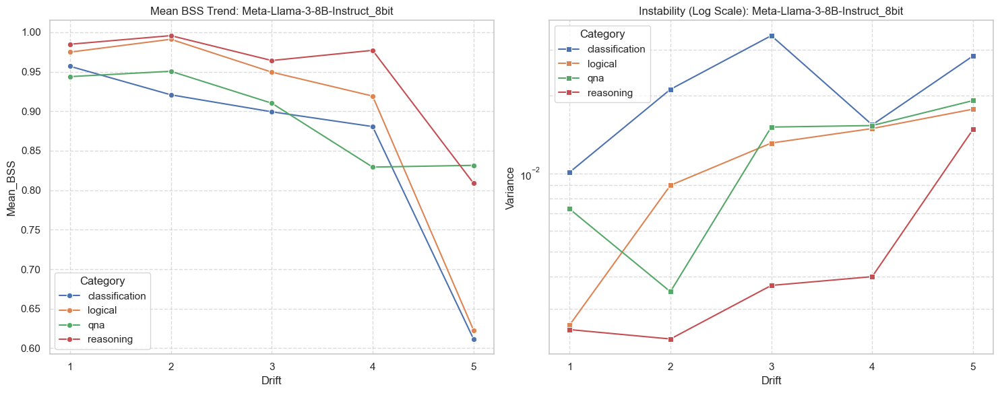

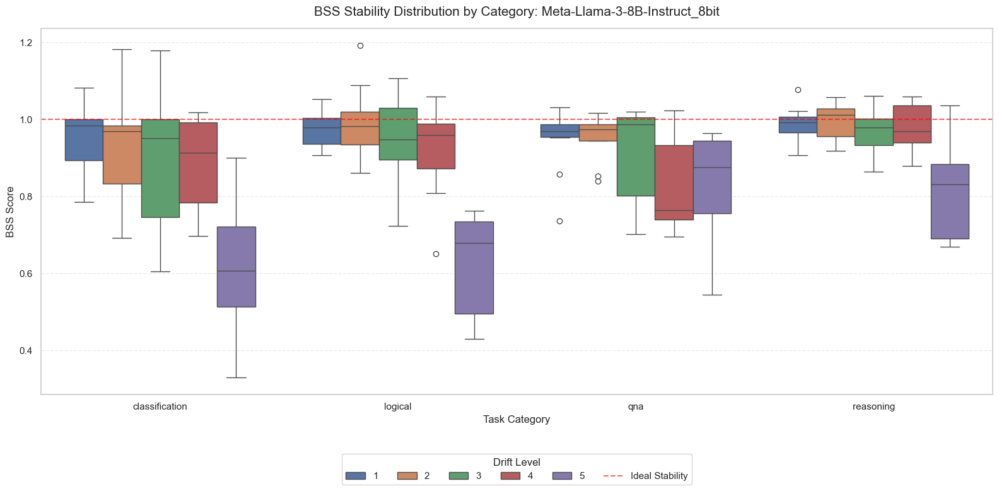

  [INFO] Setting dynamic Y-axis range: 0.41 to 1.39


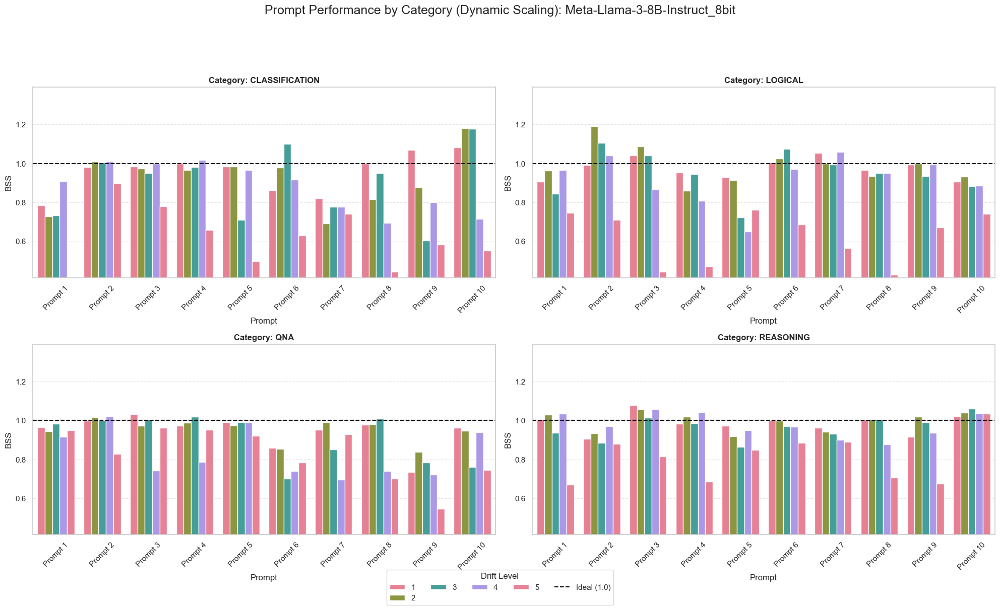

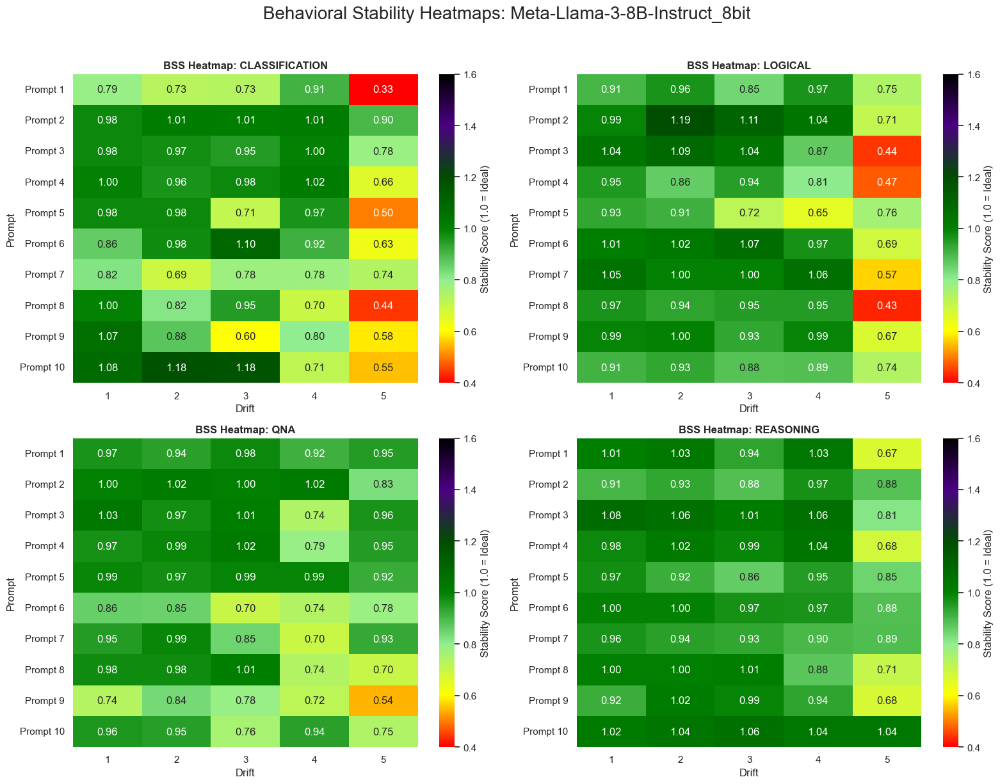


BSS EVALUATION REPORT: Meta-Llama-3-8B-Instruct_fp16


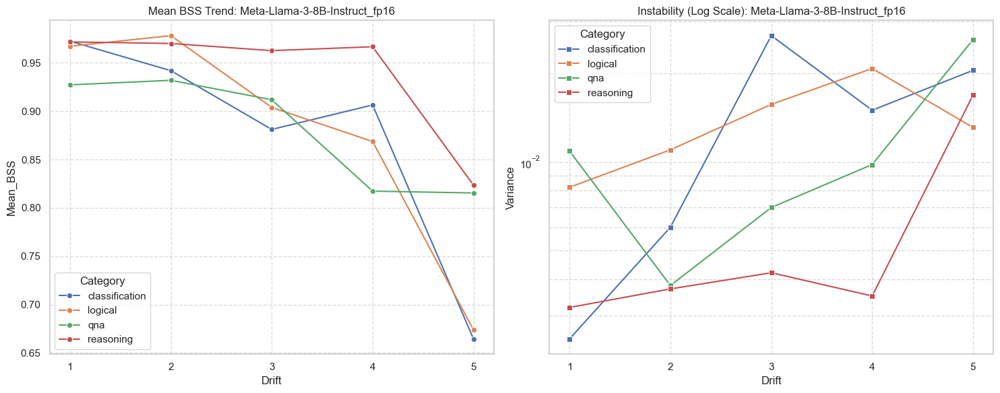

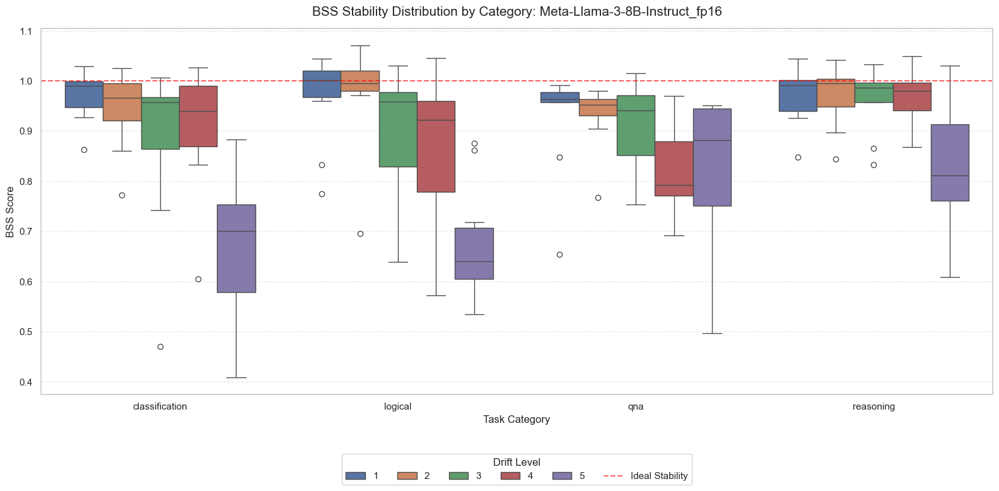

  [INFO] Setting dynamic Y-axis range: 0.50 to 1.33


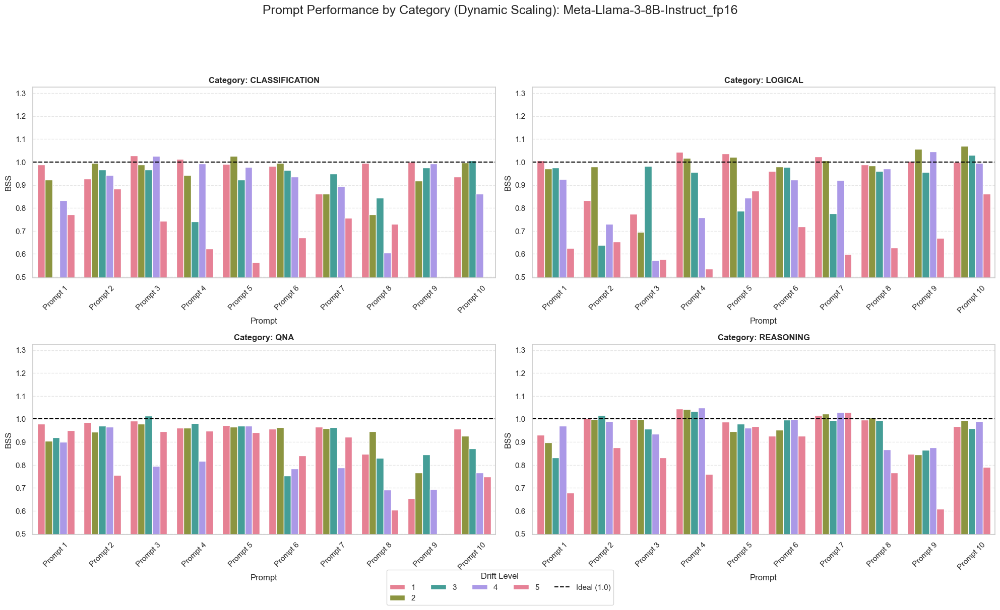

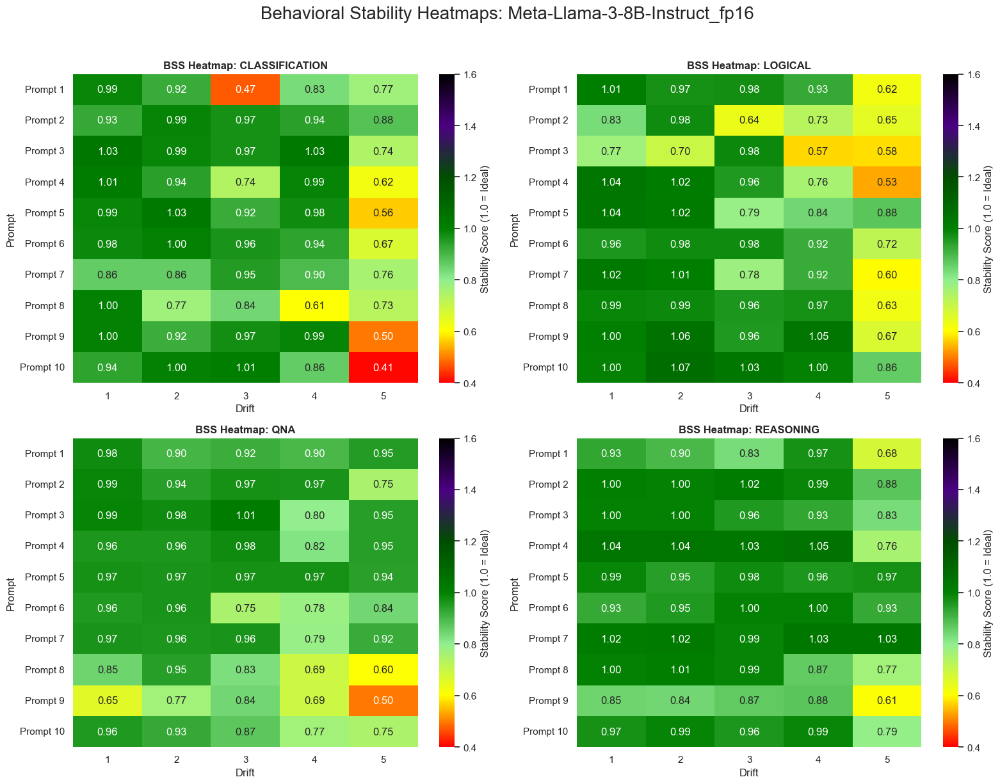


BSS EVALUATION REPORT: Phi-3-mini-4k-instruct_4bit


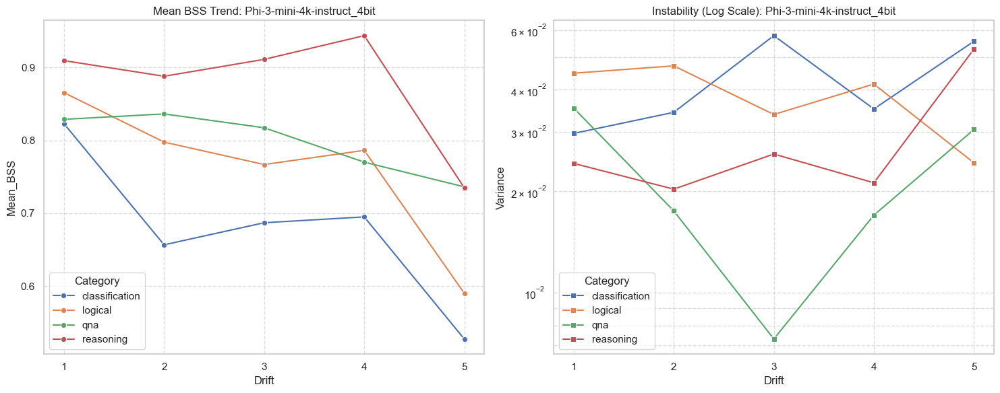

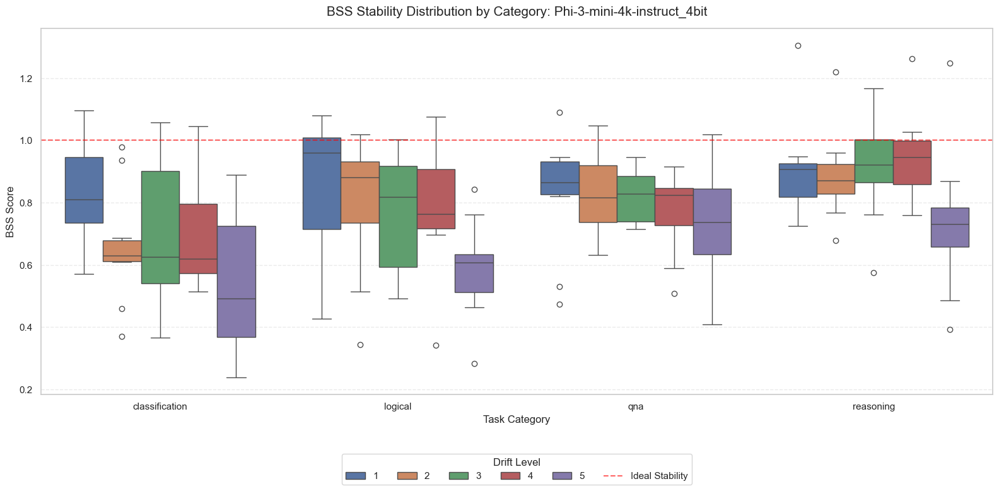

  [INFO] Setting dynamic Y-axis range: 0.10 to 1.45


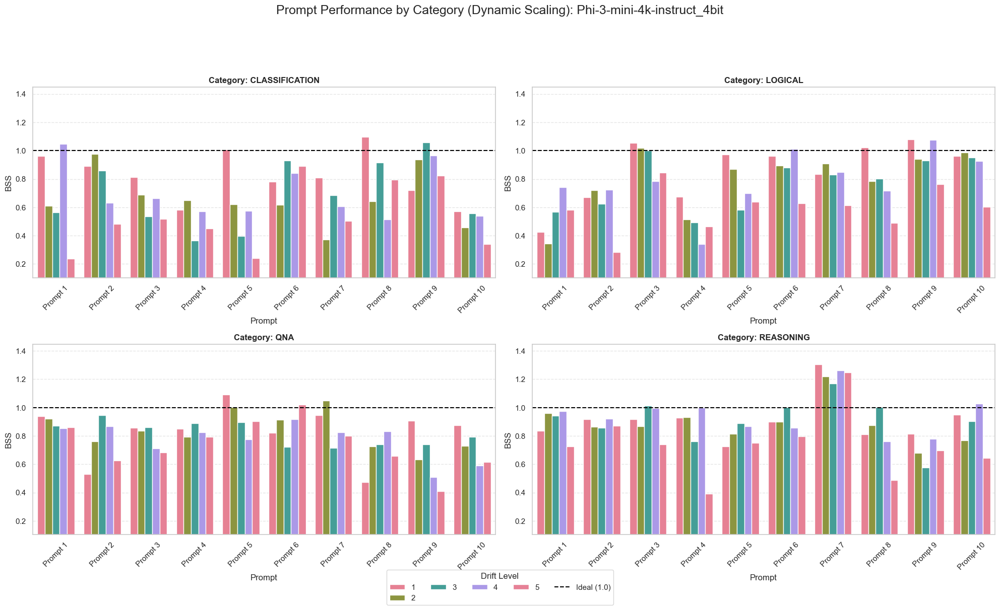

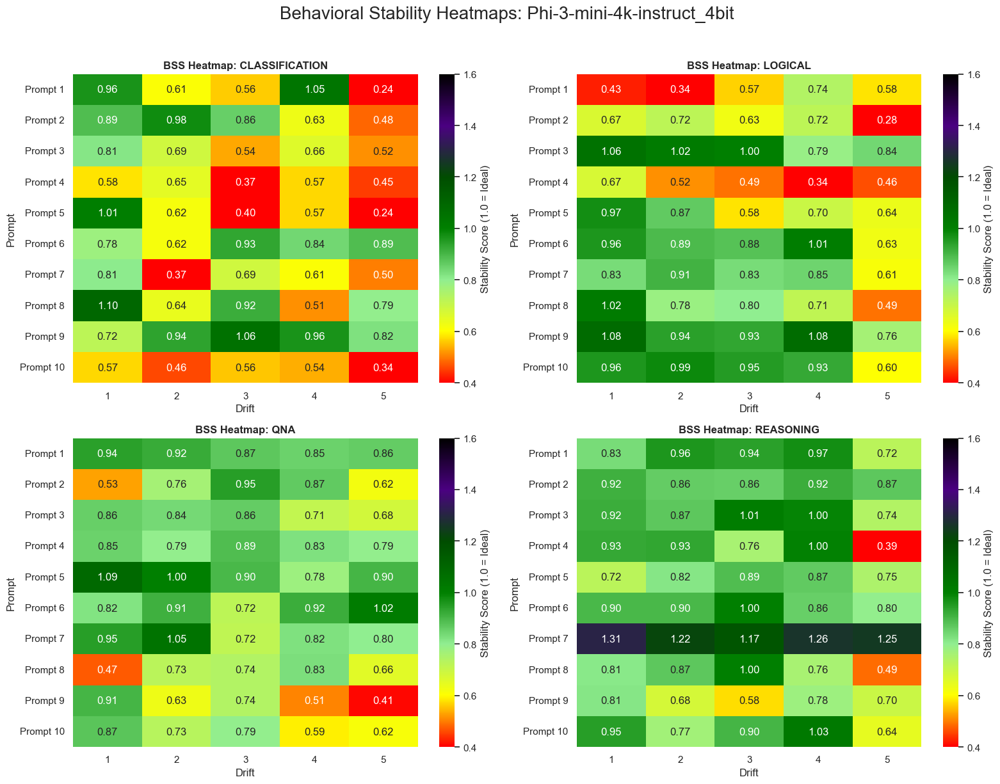


BSS EVALUATION REPORT: Phi-3-mini-4k-instruct_8bit


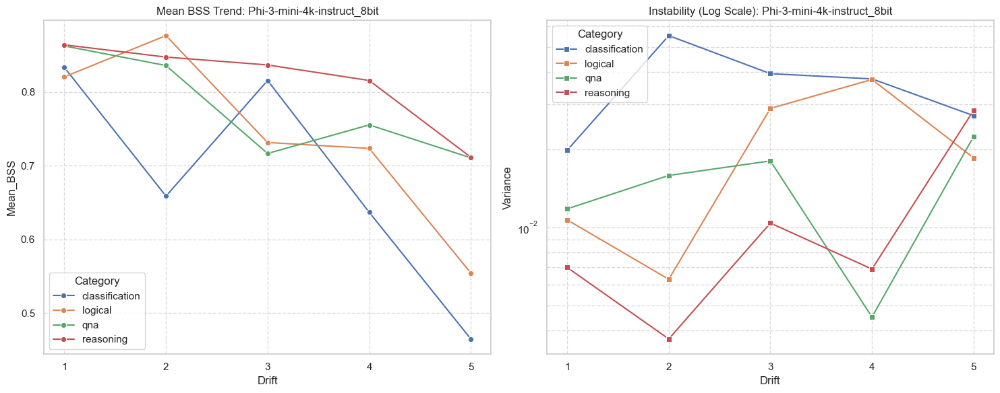

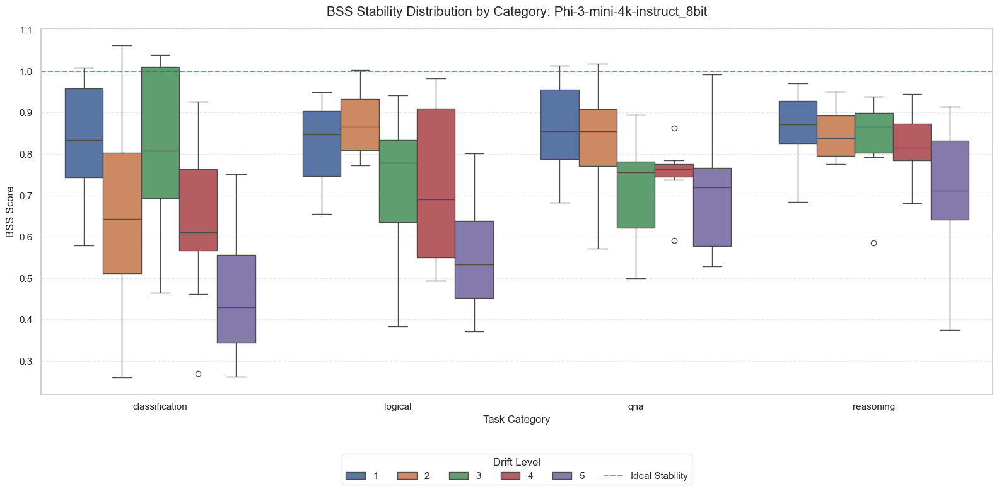

  [INFO] Setting dynamic Y-axis range: 0.20 to 1.33


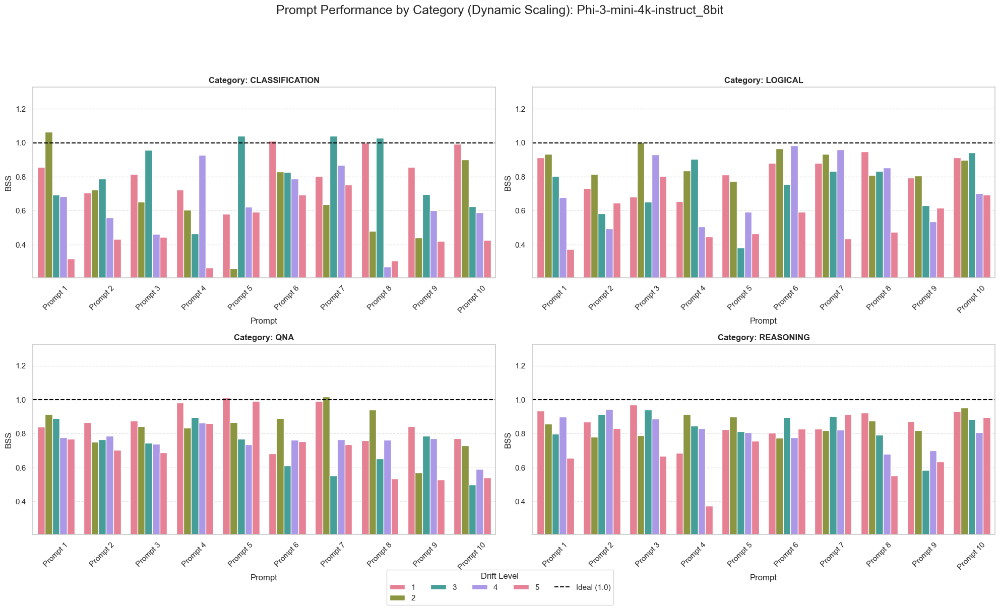

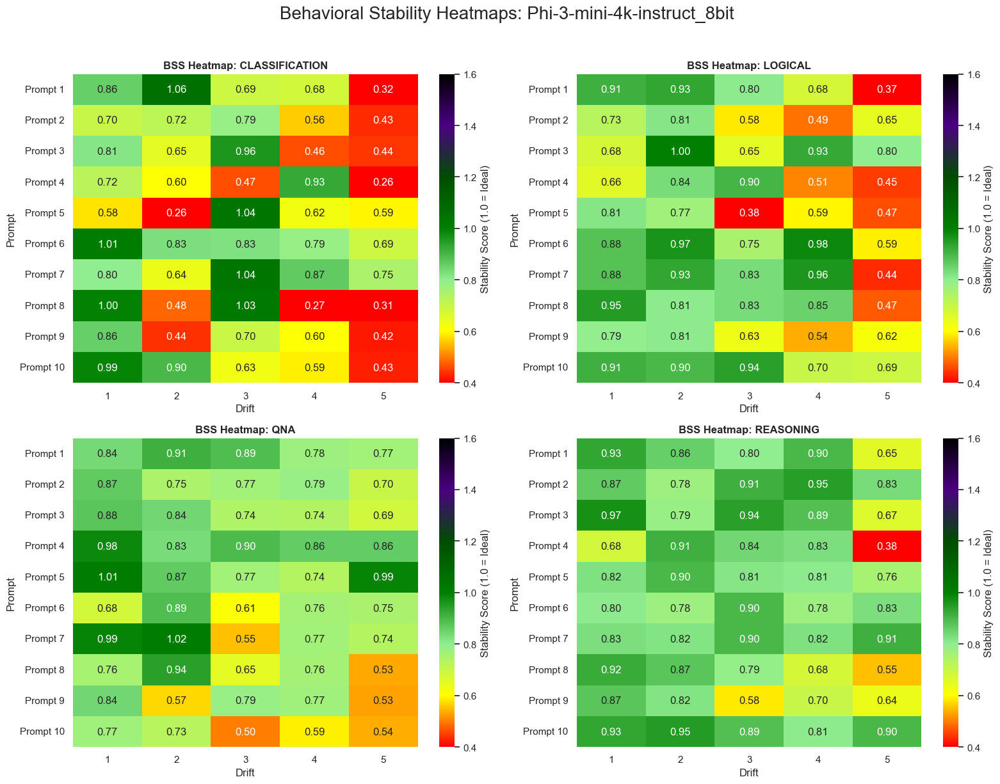


BSS EVALUATION REPORT: Phi-3-mini-4k-instruct_fp16


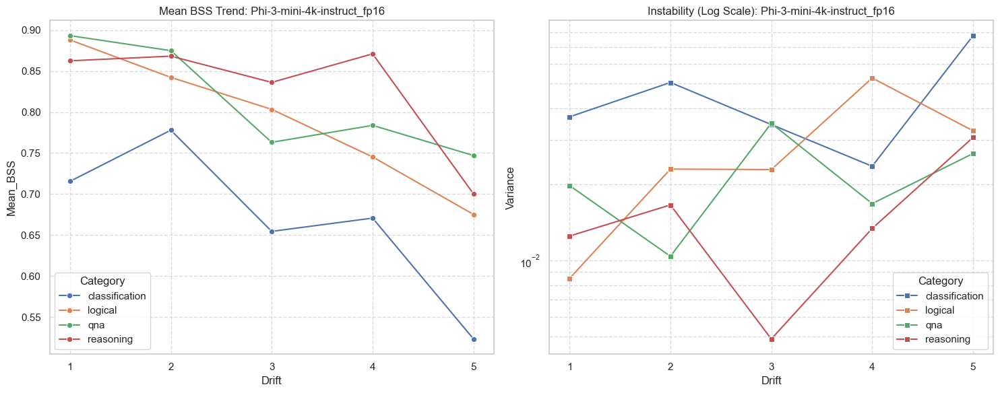

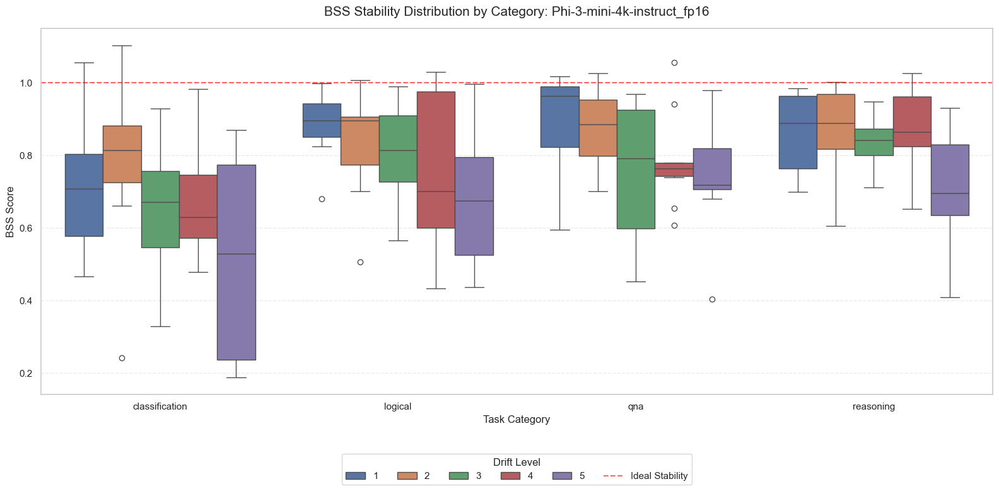

  [INFO] Setting dynamic Y-axis range: 0.23 to 1.36


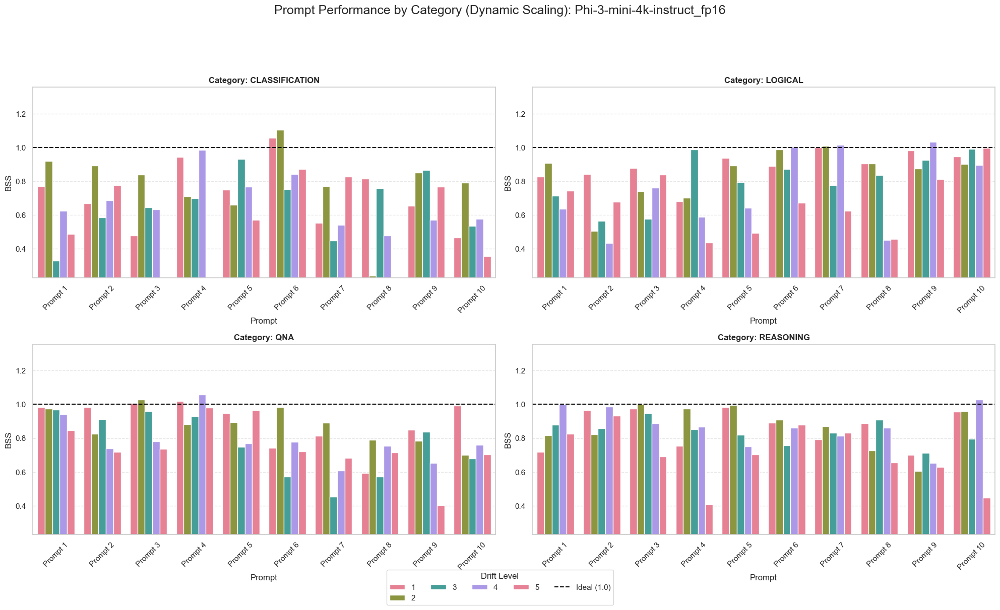

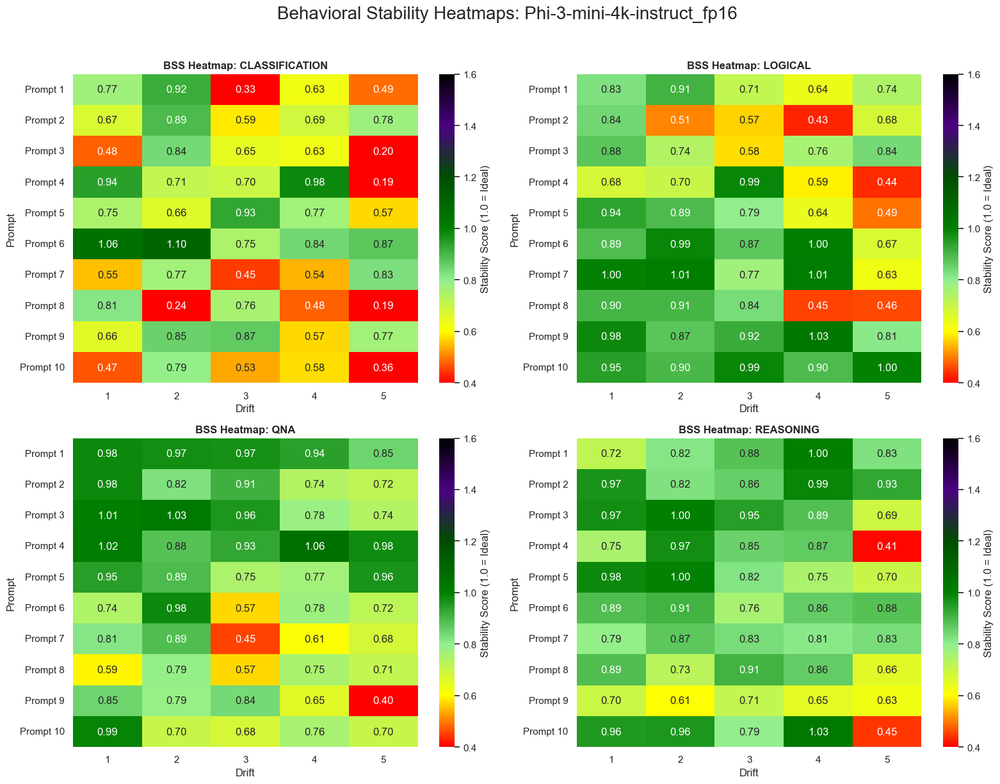


BSS EVALUATION REPORT: Mistral-7B-Instruct-v0.2_4bit


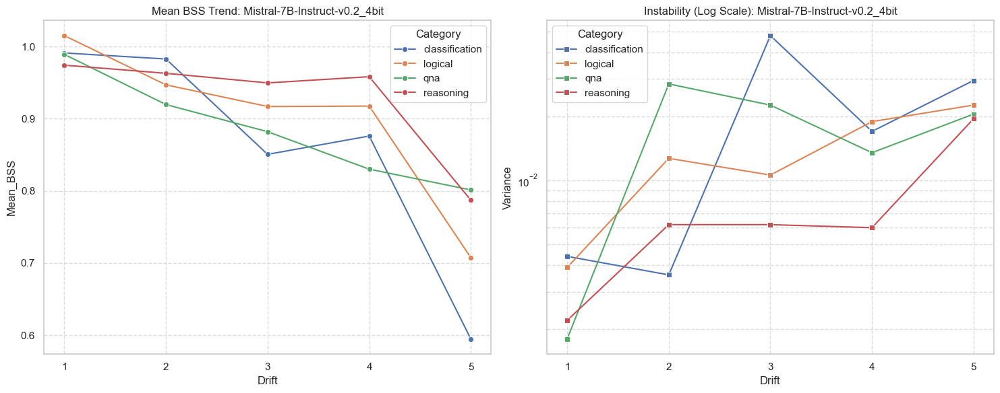

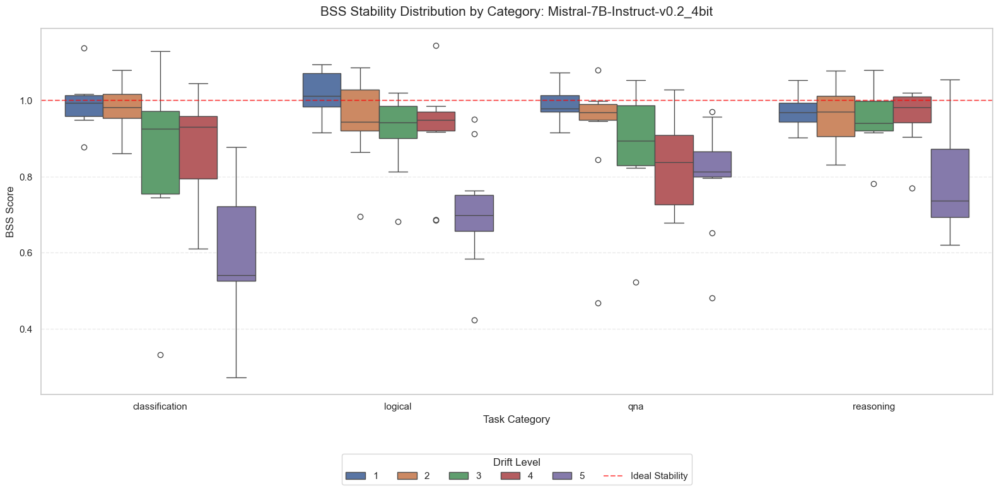

  [INFO] Setting dynamic Y-axis range: 0.46 to 1.36


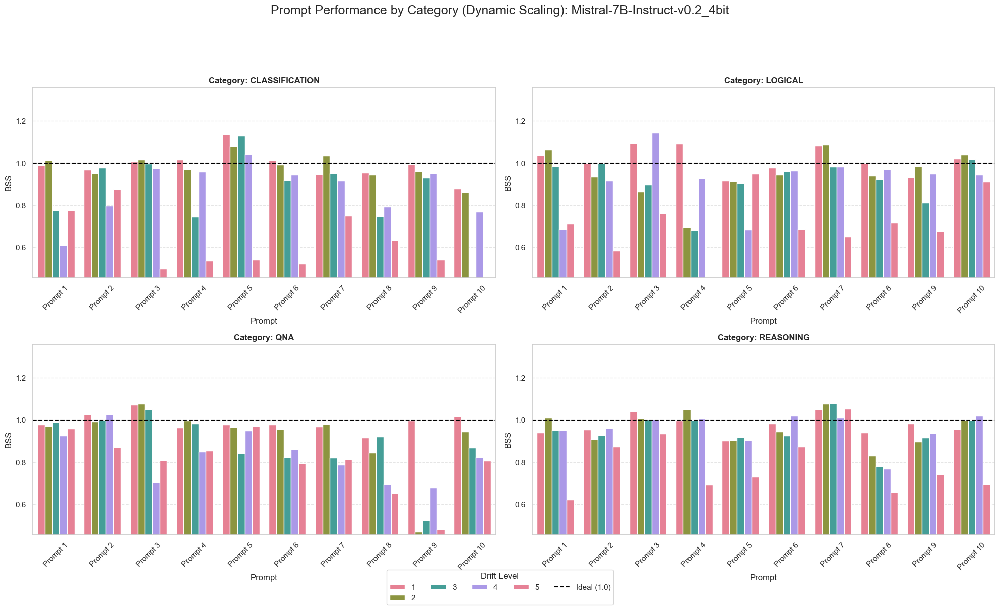

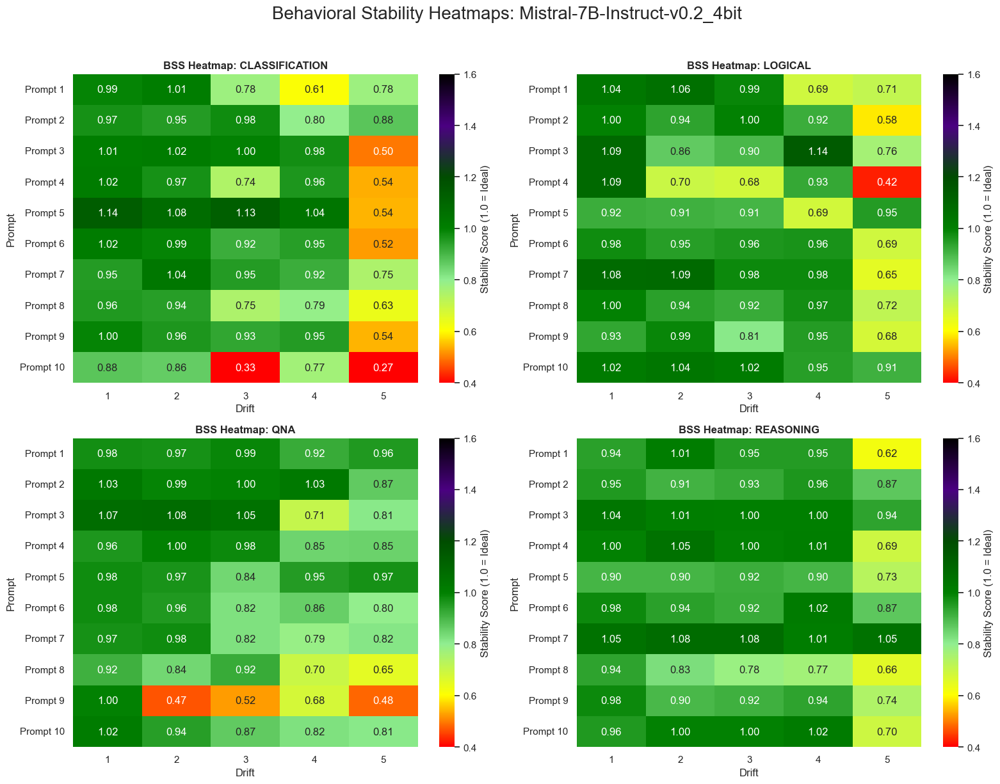


BSS EVALUATION REPORT: Mistral-7B-Instruct-v0.2_8bit


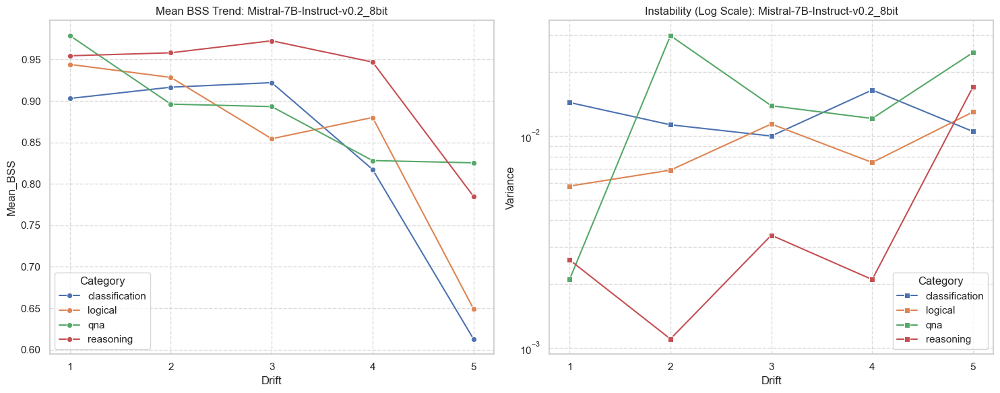

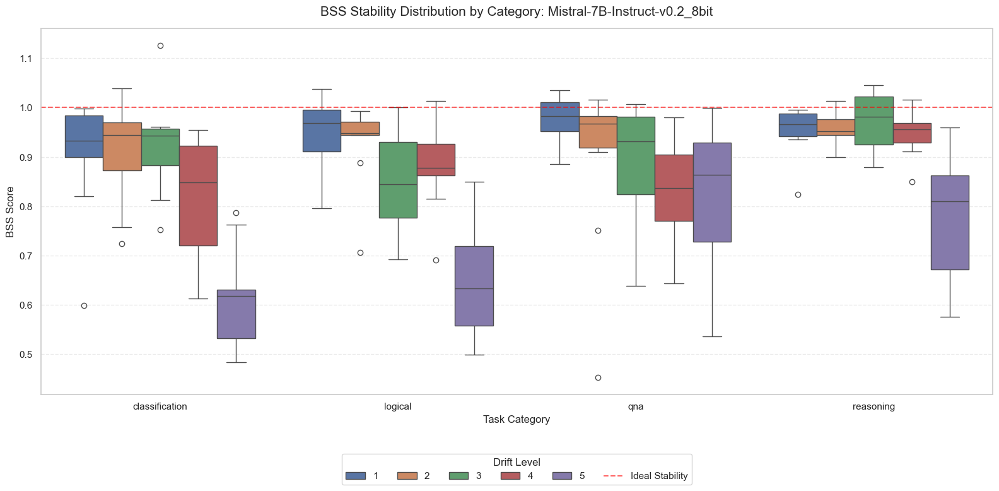

  [INFO] Setting dynamic Y-axis range: 0.48 to 1.30


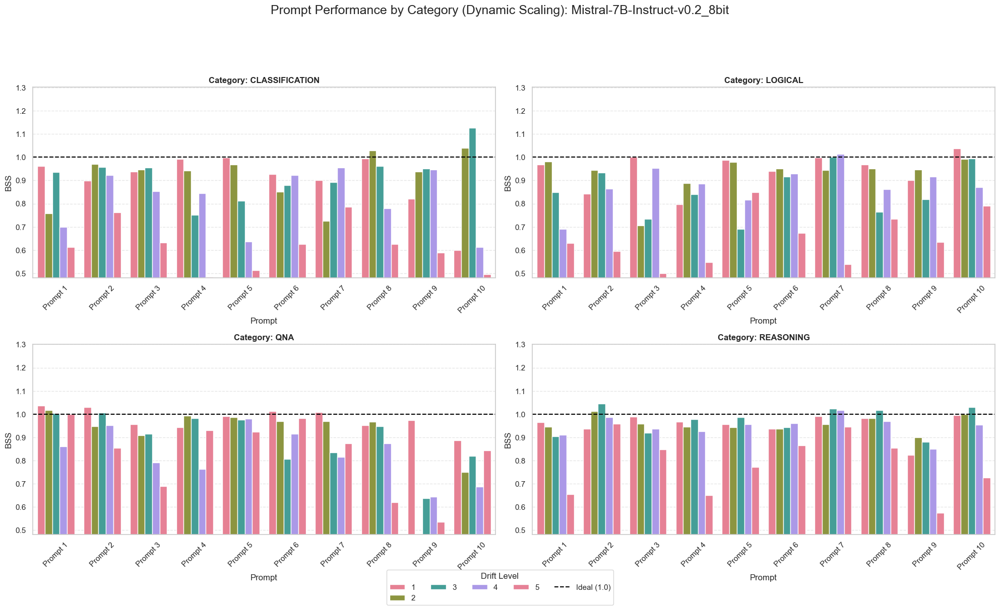

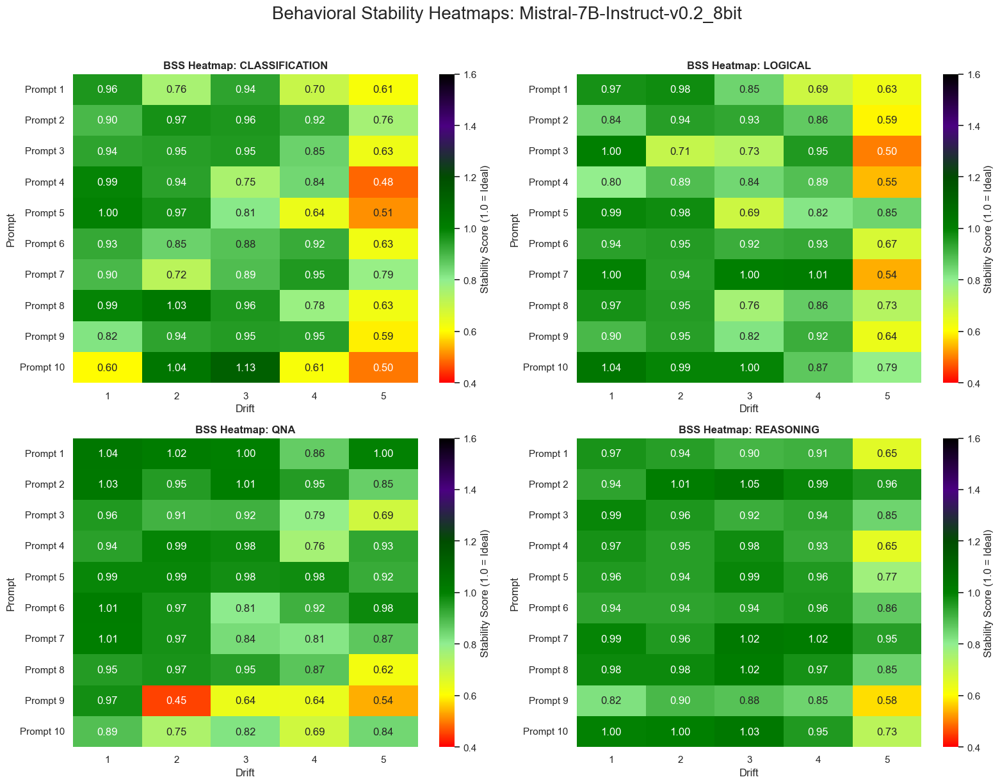


BSS EVALUATION REPORT: Mistral-7B-Instruct-v0.2_fp16


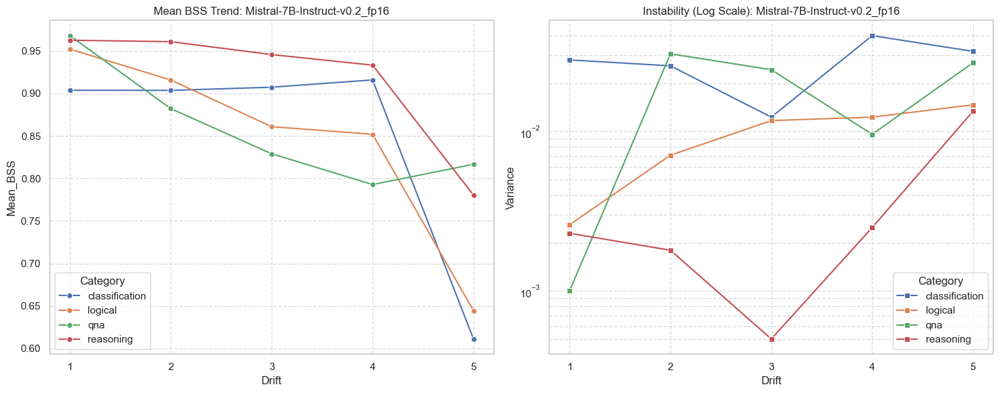

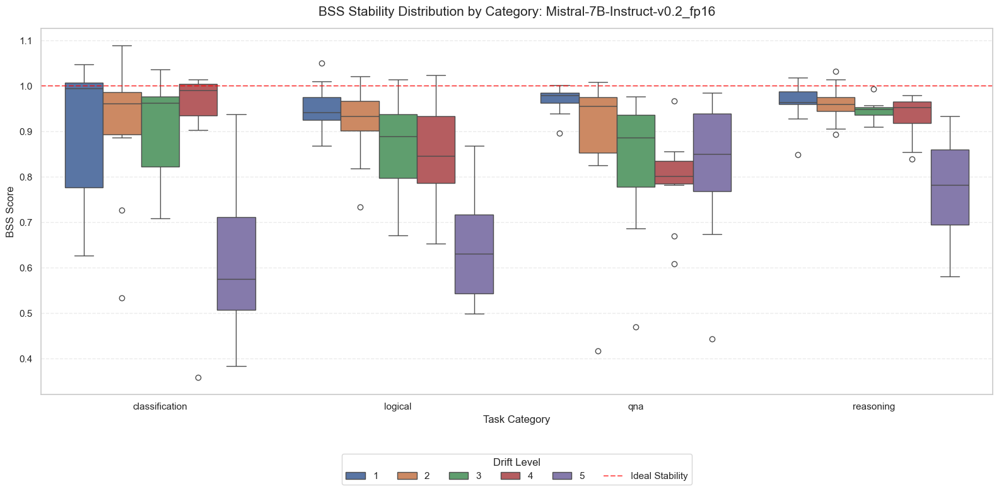

  [INFO] Setting dynamic Y-axis range: 0.44 to 1.33


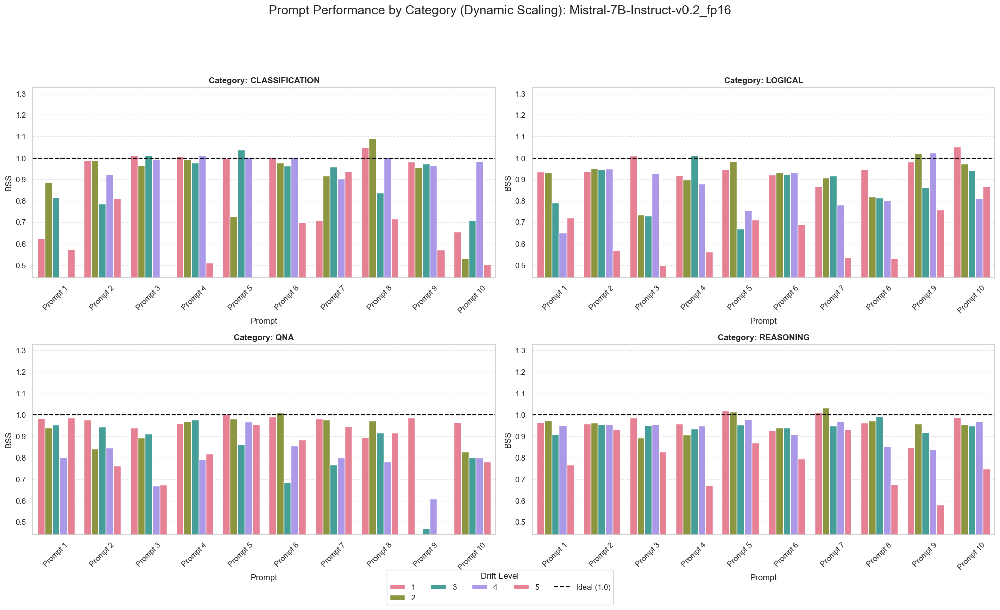

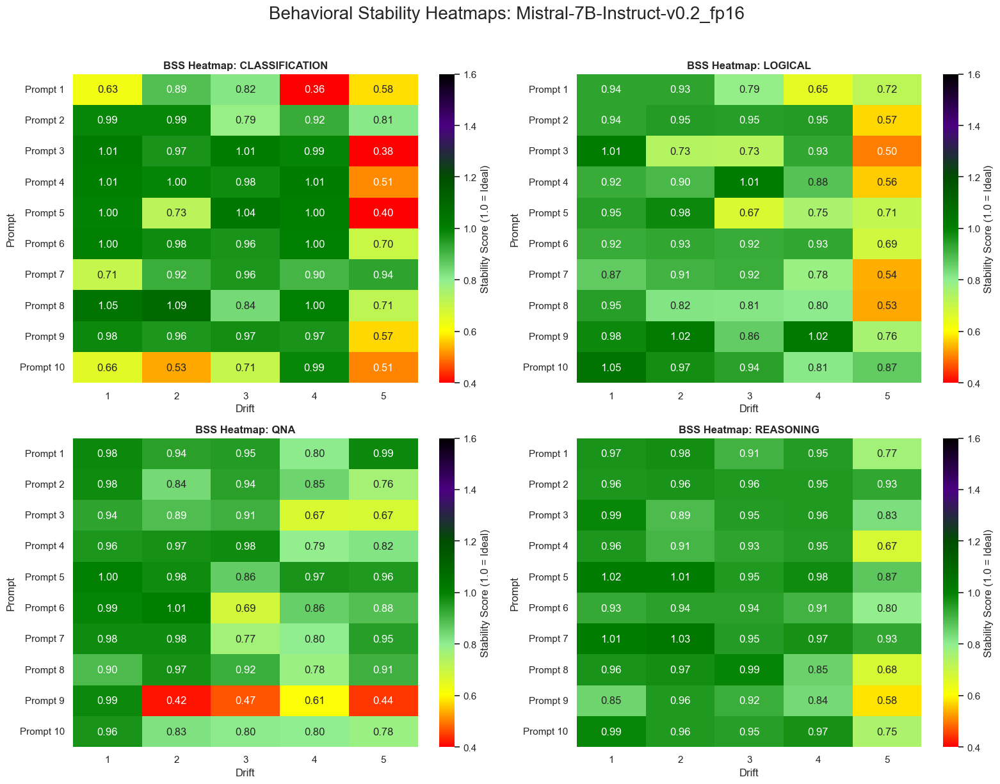

In [10]:
run_bss_visualizations(r"../6_BSS_calculation/BSS")

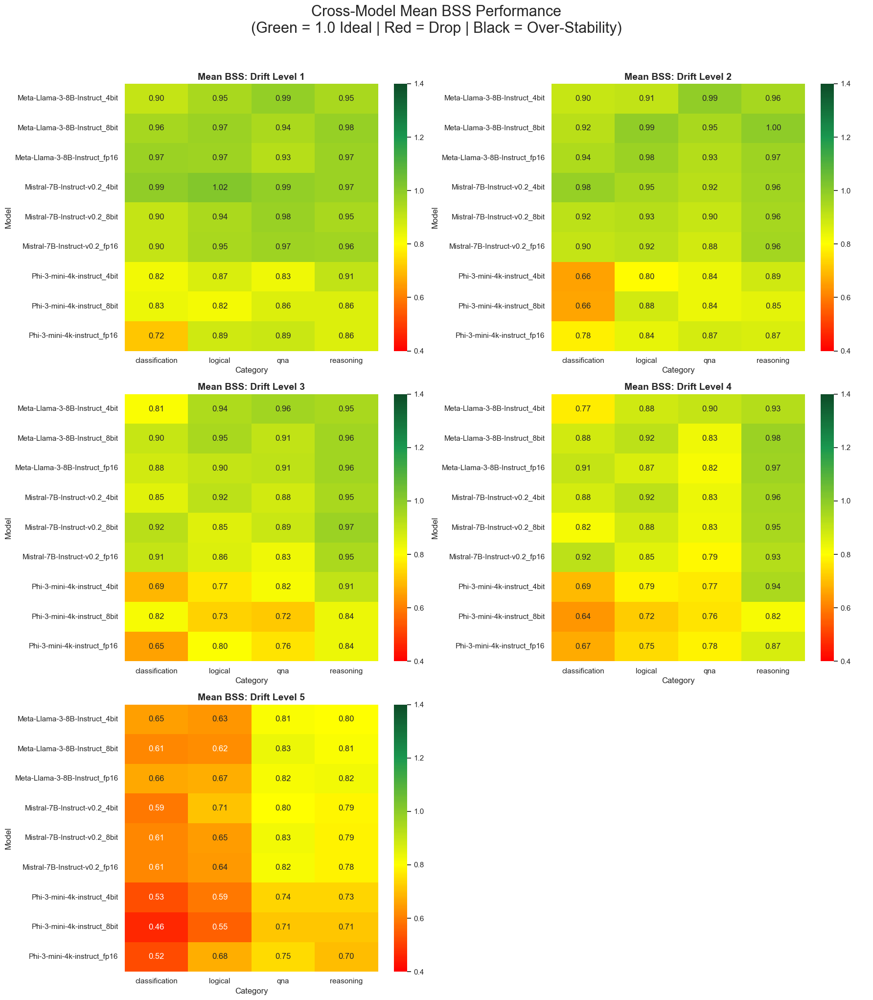

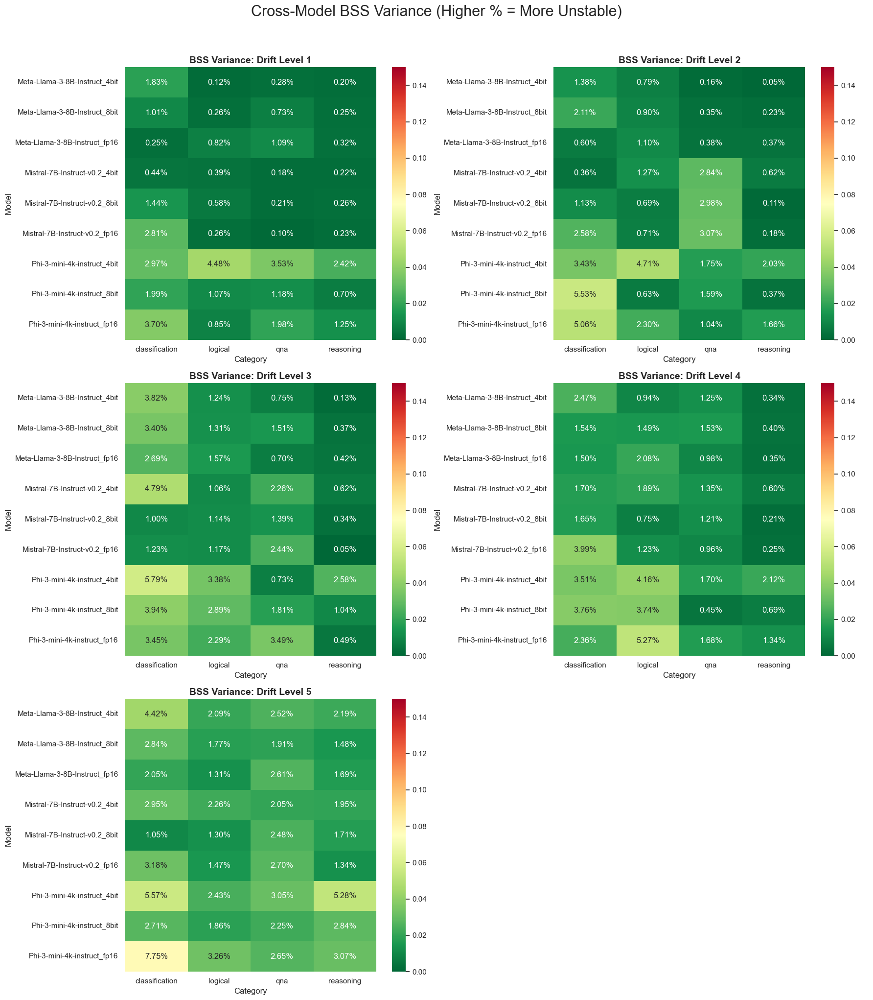

In [18]:
def plot_cross_model_bss_heatmaps(base_bss_dir):
    """
    Generates two 3x2 grid reports with 5 levels and hides the empty 6th subplot.
    1. Cross-Model Mean BSS Performance (Custom Red-Green-Black map)
    2. Cross-Model BSS Variance (Green-to-Red map)
    """
    base_path = Path(base_bss_dir)
    all_data = []

    # 1. Collect data
    for json_file in base_path.glob("**/bss_scores_with_stats.json"):
        model_name = json_file.parent.name
        with open(json_file, 'r') as f:
            data = json.load(f)
            
        for entry in data:
            drift_lvl = entry.get("Drift_Level")
            stats = entry.get("Category_Stats", {})
            for cat, stat_val in stats.items():
                var_float = float(stat_val["Variance"].strip('%')) / 100
                all_data.append({
                    "Model": model_name,
                    "Drift": drift_lvl,
                    "Category": cat,
                    "Mean_BSS": stat_val["Mean"],
                    "Variance": var_float
                })

    df_all = pd.DataFrame(all_data)
    if df_all.empty:
        print("No BSS data found for comparison.")
        return

    # --- CUSTOM COLORMAP FOR BSS MEAN ---
    # Red -> Yellow -> Green (1.0) -> Black
    bss_colors = ["#FF0000", "#FFFF00", "#1a9850", "#000000"]
    bss_cmap = mcolors.LinearSegmentedColormap.from_list("BSS_Custom", bss_colors)

    levels = sorted(df_all['Drift'].unique())

    # --- FUNCTION 1: MEAN BSS HEATMAP (3x2 Grid) ---
    fig_mean, axes_mean = plt.subplots(3, 2, figsize=(18, 20))
    axes_mean = axes_mean.flatten()

    for i, lvl in enumerate(levels):
        subset = df_all[df_all['Drift'] == lvl]
        pivot_mean = subset.pivot_table(index="Model", columns="Category", values="Mean_BSS")
        
        sns.heatmap(pivot_mean, annot=True, cmap=bss_cmap, center=1.0, 
                    vmin=0.4, vmax=1.4, fmt=".2f", ax=axes_mean[i])
        axes_mean[i].set_title(f"Mean BSS: Drift Level {lvl}", fontweight='bold', fontsize=14)

    # HIDE EMPTY SUBPLOTS
    for j in range(len(levels), len(axes_mean)):
        axes_mean[j].axis('off')

    plt.suptitle("Cross-Model Mean BSS Performance\n(Green = 1.0 Ideal | Red = Drop | Black = Over-Stability)", 
                 fontsize=22, y=1.02)
    plt.tight_layout()
    plt.show()

    # --- FUNCTION 2: VARIANCE HEATMAP (3x2 Grid) ---
    fig_var, axes_var = plt.subplots(3, 2, figsize=(18, 20))
    axes_var = axes_var.flatten()

    for i, lvl in enumerate(levels):
        subset = df_all[df_all['Drift'] == lvl]
        pivot_var = subset.pivot_table(index="Model", columns="Category", values="Variance")
        
        # Lower variance is better: Green (0%) to Red (High)
        sns.heatmap(pivot_var, annot=True, cmap="RdYlGn_r", vmin=0, vmax=0.15, fmt=".2%", ax=axes_var[i])
        axes_var[i].set_title(f"BSS Variance: Drift Level {lvl}", fontweight='bold', fontsize=14)

    # HIDE EMPTY SUBPLOTS
    for j in range(len(levels), len(axes_var)):
        axes_var[j].axis('off')

    plt.suptitle("Cross-Model BSS Variance (Higher % = More Unstable)", fontsize=22, y=1.02)
    plt.tight_layout()
    plt.show()

# Run the comparisons
plot_cross_model_bss_heatmaps(r"../6_BSS_calculation/BSS")

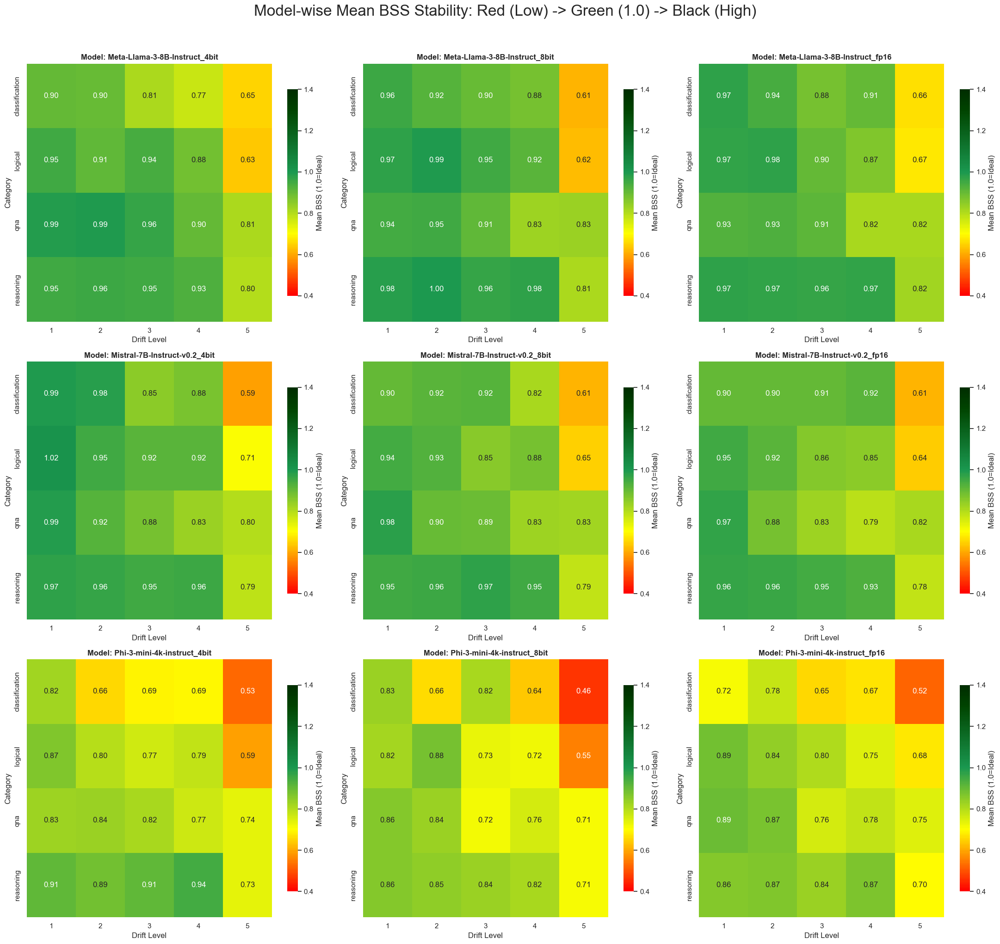

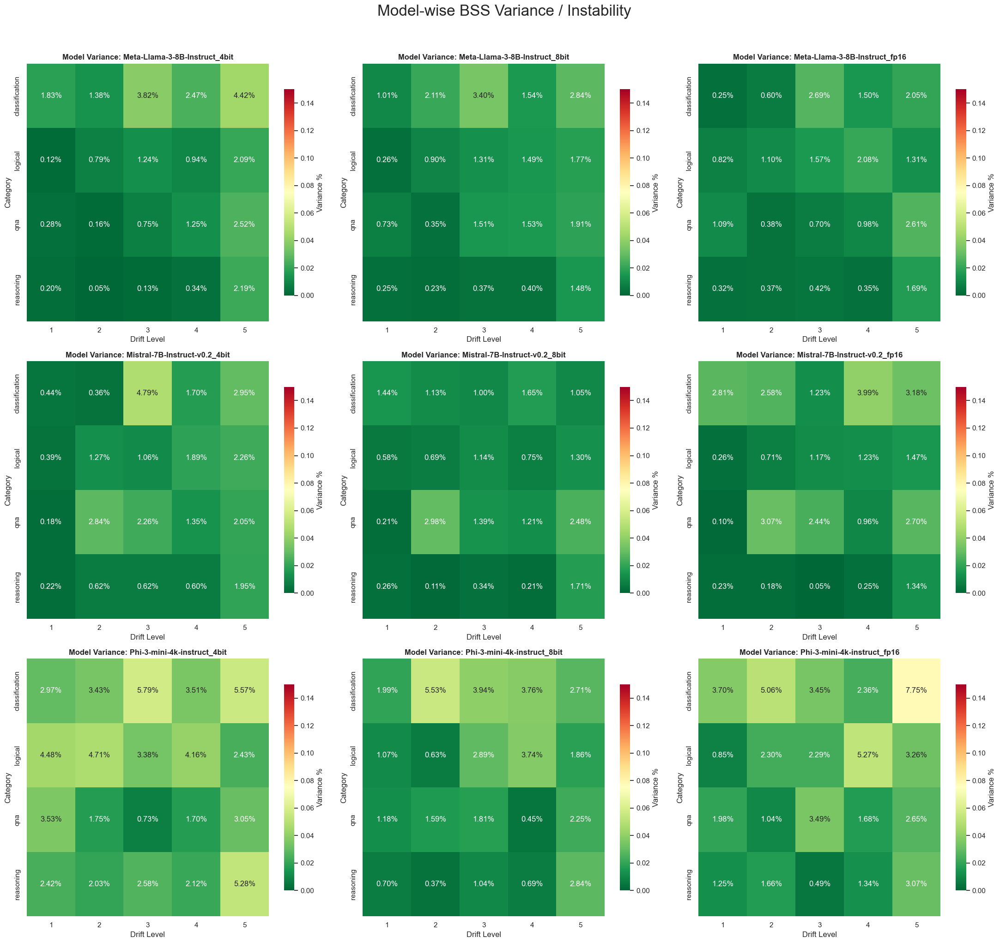

In [12]:
def plot_modelwise_bss_reports(base_bss_dir):
    """
    Generates Model-wise 3x3 grid reports with a custom BSS colormap:
    Red (Low) -> Yellow -> Green (1.0) -> Black (High)
    """
    base_path = Path(base_bss_dir)
    all_data = []

    # 1. Collect all data
    for json_file in base_path.glob("**/bss_scores_with_stats.json"):
        model_name = json_file.parent.name
        try:
            with open(json_file, 'r') as f:
                data = json.load(f)
                
            for entry in data:
                drift_lvl = entry.get("Drift_Level")
                stats = entry.get("Category_Stats", {})
                for cat, stat_val in stats.items():
                    var_float = float(stat_val["Variance"].strip('%')) / 100
                    all_data.append({
                        "Model": model_name,
                        "Drift": drift_lvl,
                        "Category": cat,
                        "Mean_BSS": stat_val["Mean"],
                        "Variance": var_float
                    })
        except Exception as e:
            print(f"⚠️ Error loading {model_name}: {e}")

    df_all = pd.DataFrame(all_data)
    if df_all.empty:
        print("❌ No BSS data found for heatmaps.")
        return

    # --- CUSTOM COLORMAP DEFINITION ---
    # 0.0 (Red) -> 0.5 (Yellow) -> 1.0 (Normal Green) -> 1.3 (Black)
    bss_colors = ["#FF0000", "#FFFF00", "#1a9850", "#004400", "#000000"]
    # Adjusting the nodes to ensure 1.0 is the center 'Green' anchor
    # We map these to the vmin (0.4) and vmax (1.4) range
    bss_cmap = mcolors.LinearSegmentedColormap.from_list("BSS_Custom", bss_colors)

    models = sorted(df_all['Model'].unique())
    
    # --- REPORT 1: MEAN BSS MODEL-WISE ---
    fig_mean, axes_mean = plt.subplots(3, 3, figsize=(22, 20))
    axes_mean = axes_mean.flatten()

    for i, model in enumerate(models):
        if i >= 9: break 
        subset = df_all[df_all['Model'] == model]
        pivot_mean = subset.pivot_table(index="Category", columns="Drift", values="Mean_BSS")
        
        # Using center=1.0 to lock the 'Normal Green' to the Ideal score
        sns.heatmap(pivot_mean, annot=True, cmap=bss_cmap, center=1.0, 
                    vmin=0.4, vmax=1.4, fmt=".2f", ax=axes_mean[i], 
                    cbar=True, cbar_kws={'label': 'Mean BSS (1.0=Ideal)', 'shrink': 0.8})
        
        axes_mean[i].set_title(f"Model: {model}", fontweight='bold', fontsize=12)
        axes_mean[i].set_xlabel("Drift Level")
        axes_mean[i].set_ylabel("Category")

    plt.suptitle("Model-wise Mean BSS Stability: Red (Low) -> Green (1.0) -> Black (High)", fontsize=24, y=1.02)
    plt.tight_layout()
    plt.show()

    # --- REPORT 2: VARIANCE MODEL-WISE ---
    # Keeping Variance on the Standard RdYlGn_r (Green=Low/Good, Red=High/Bad)
    fig_var, axes_var = plt.subplots(3, 3, figsize=(22, 20))
    axes_var = axes_var.flatten()

    for i, model in enumerate(models):
        if i >= 9: break
        subset = df_all[df_all['Model'] == model]
        pivot_var = subset.pivot_table(index="Category", columns="Drift", values="Variance")
        
        sns.heatmap(pivot_var, annot=True, cmap="RdYlGn_r", 
                    vmin=0, vmax=0.15, fmt=".2%", ax=axes_var[i], 
                    cbar=True, cbar_kws={'label': 'Variance %', 'shrink': 0.8})
        
        axes_var[i].set_title(f"Model Variance: {model}", fontweight='bold', fontsize=12)
        axes_var[i].set_xlabel("Drift Level")
        axes_var[i].set_ylabel("Category")

    plt.suptitle("Model-wise BSS Variance / Instability", fontsize=24, y=1.02)
    plt.tight_layout()
    plt.show()

# Run the updated analysis
plot_modelwise_bss_reports(r"../6_BSS_calculation/BSS")

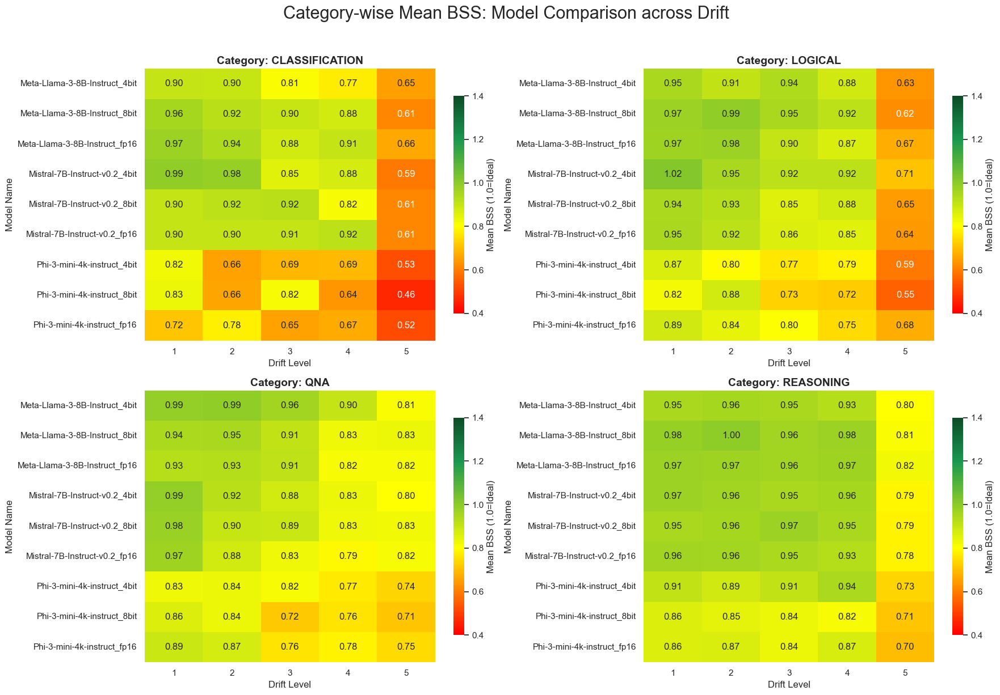

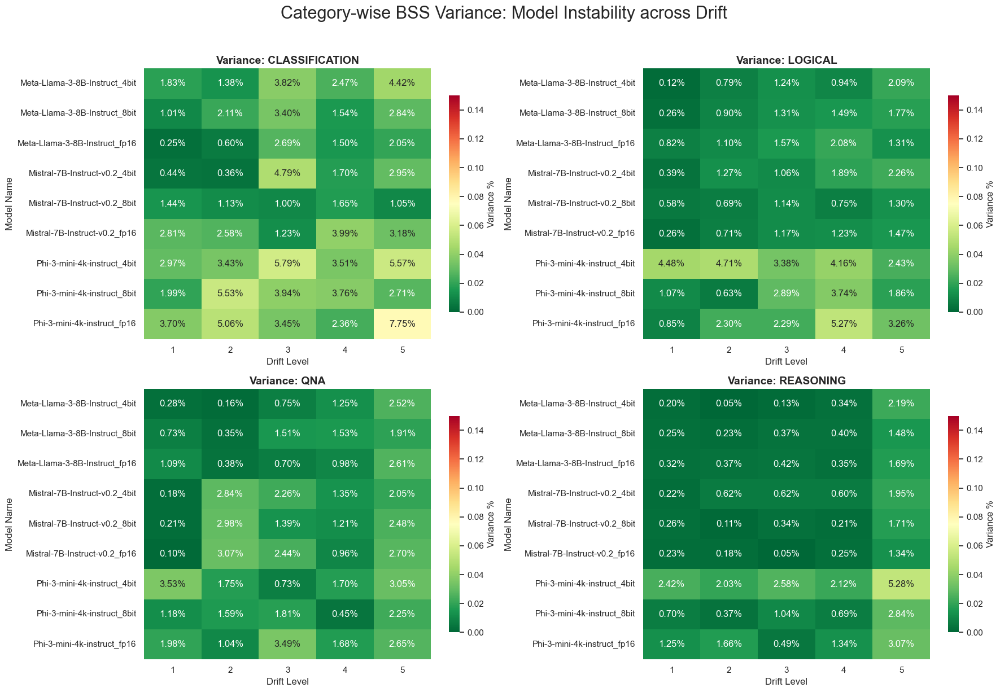

In [19]:
def plot_categorywise_bss_reports(base_bss_dir):
    """
    Generates Category-wise grid reports:
    X-axis: Drift Level (0-5)
    Y-axis: Model Name
    
    1. Mean BSS (Custom: Red -> Green -> Black)
    2. Variance (Green -> Red)
    """
    base_path = Path(base_bss_dir)
    all_data = []

    # 1. Collect all data
    for json_file in base_path.glob("**/bss_scores_with_stats.json"):
        model_name = json_file.parent.name
        try:
            with open(json_file, 'r') as f:
                data = json.load(f)
                
            for entry in data:
                drift_lvl = entry.get("Drift_Level")
                stats = entry.get("Category_Stats", {})
                for cat, stat_val in stats.items():
                    var_float = float(stat_val["Variance"].strip('%')) / 100
                    all_data.append({
                        "Model": model_name,
                        "Drift": drift_lvl,
                        "Category": cat,
                        "Mean_BSS": stat_val["Mean"],
                        "Variance": var_float
                    })
        except Exception as e:
            print(f"⚠️ Error loading {model_name}: {e}")

    df_all = pd.DataFrame(all_data)
    if df_all.empty:
        print("❌ No BSS data found for heatmaps.")
        return

    # --- CUSTOM COLORMAP DEFINITION ---
    # Red (0.4) -> Yellow -> Green (1.0) -> Black (1.4)
    bss_colors = ["#FF0000", "#FFFF00", "#1a9850", "#000000"]
    bss_cmap = mcolors.LinearSegmentedColormap.from_list("BSS_Custom", bss_colors)

    categories = sorted(df_all['Category'].unique())
    n_cats = len(categories)
    
    # Determine grid size (usually 2x2 for 4 categories)
    cols = 2
    rows = (n_cats + 1) // 2

    # --- REPORT 1: MEAN BSS CATEGORY-WISE ---
    fig_mean, axes_mean = plt.subplots(rows, cols, figsize=(18, 6 * rows))
    axes_mean = axes_mean.flatten()

    for i, cat in enumerate(categories):
        subset = df_all[df_all['Category'] == cat]
        # Pivot: Model on Y, Drift on X
        pivot_mean = subset.pivot_table(index="Model", columns="Drift", values="Mean_BSS")
        
        sns.heatmap(pivot_mean, annot=True, cmap=bss_cmap, center=1.0, 
                    vmin=0.4, vmax=1.4, fmt=".2f", ax=axes_mean[i], 
                    cbar_kws={'label': 'Mean BSS (1.0=Ideal)', 'shrink': 0.8})
        
        axes_mean[i].set_title(f"Category: {cat.upper()}", fontweight='bold', fontsize=14)
        axes_mean[i].set_xlabel("Drift Level")
        axes_mean[i].set_ylabel("Model Name")

    # Hide unused plots
    for j in range(i + 1, len(axes_mean)):
        axes_mean[j].axis('off')

    plt.suptitle("Category-wise Mean BSS: Model Comparison across Drift", fontsize=22, y=1.02)
    plt.tight_layout()
    plt.show()

    # --- REPORT 2: VARIANCE CATEGORY-WISE ---
    fig_var, axes_var = plt.subplots(rows, cols, figsize=(18, 6 * rows))
    axes_var = axes_var.flatten()

    for i, cat in enumerate(categories):
        subset = df_all[df_all['Category'] == cat]
        pivot_var = subset.pivot_table(index="Model", columns="Drift", values="Variance")
        
        sns.heatmap(pivot_var, annot=True, cmap="RdYlGn_r", 
                    vmin=0, vmax=0.15, fmt=".2%", ax=axes_var[i], 
                    cbar_kws={'label': 'Variance %', 'shrink': 0.8})
        
        axes_var[i].set_title(f"Variance: {cat.upper()}", fontweight='bold', fontsize=14)
        axes_var[i].set_xlabel("Drift Level")
        axes_var[i].set_ylabel("Model Name")

    for j in range(i + 1, len(axes_var)):
        axes_var[j].axis('off')

    plt.suptitle("Category-wise BSS Variance: Model Instability across Drift", fontsize=22, y=1.02)
    plt.tight_layout()
    plt.show()

# Run the category-wise analysis
plot_categorywise_bss_reports(r"../6_BSS_calculation/BSS")

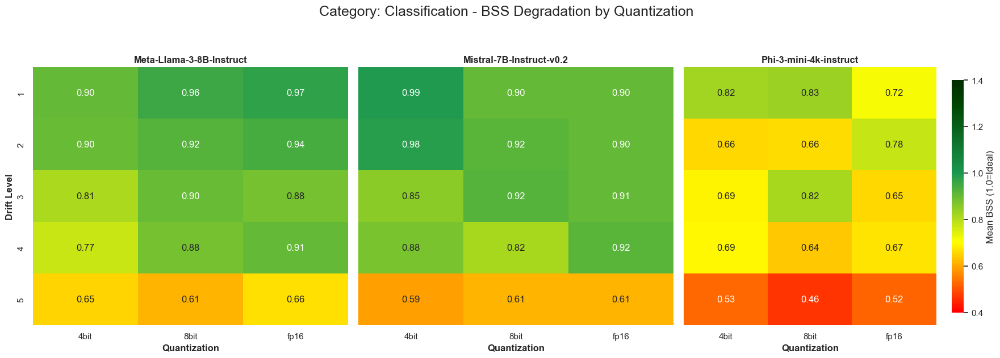

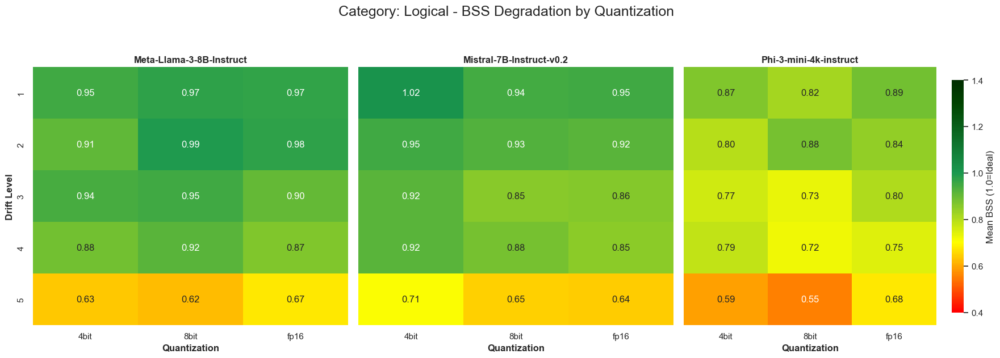

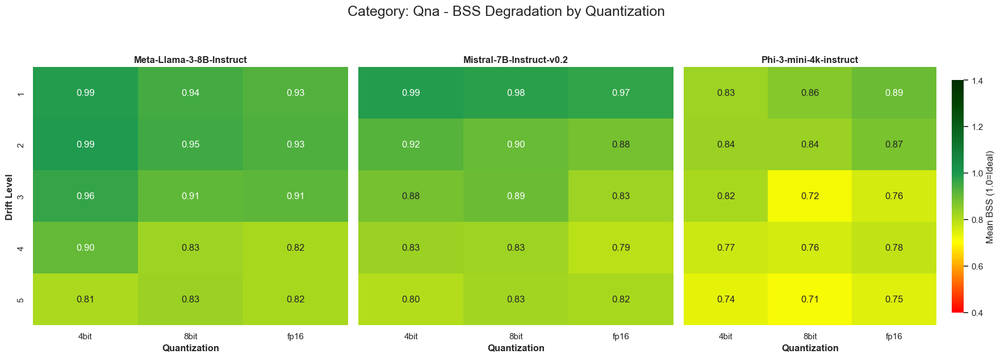

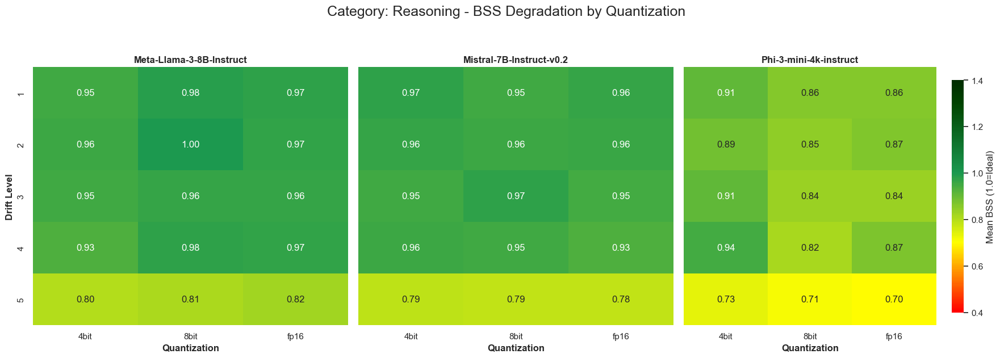

In [14]:
def plot_quantization_bss_reports(base_bss_dir):
    """
    Generates Category-wise heatmaps grouped by Base Model.
    Each figure shows 1 Category, split into subgraphs for each Base Model,
    comparing Quantization levels (4bit, 8bit, fp16) against Drift Level.
    """
    base_path = Path(base_bss_dir)
    all_data = []

    # 1. Collect all data
    for json_file in base_path.rglob("bss_scores_with_stats.json"):
        # Expecting folder names like "Meta-Llama-3-8B-Instruct_4bit"
        model_string = json_file.parent.name
        try:
            with open(json_file, 'r') as f:
                data = json.load(f)
                
            for entry in data:
                drift_lvl = entry.get("Drift_Level")
                stats = entry.get("Category_Stats", {})
                for cat, stat_val in stats.items():
                    var_str = str(stat_val["Variance"]).replace('%', '')
                    var_float = float(var_str) / 100
                    
                    all_data.append({
                        "Model_String": model_string,
                        "Drift": drift_lvl,
                        "Category": cat,
                        "Mean_BSS": stat_val["Mean"],
                        "Variance": var_float
                    })
        except Exception as e:
            print(f"⚠️ Error loading {model_string}: {e}")

    df_all = pd.DataFrame(all_data)
    if df_all.empty:
        print("❌ No BSS data found for heatmaps.")
        return

    # 2. Extract Base Model and Quantization from the folder name
    # Splits on the LAST underscore. 
    # Example: "Meta-Llama-3-8B-Instruct_4bit" -> Base: "Meta-Llama-3-8B-Instruct", Quant: "4bit"
    df_all['Base_Model'] = df_all['Model_String'].apply(lambda x: x.rsplit('_', 1)[0])
    df_all['Quantization'] = df_all['Model_String'].apply(lambda x: x.rsplit('_', 1)[1])

    # --- CUSTOM COLORMAP DEFINITION ---
    bss_colors = ["#FF0000", "#FFFF00", "#1a9850", "#004400", "#000000"]
    bss_cmap = mcolors.LinearSegmentedColormap.from_list("BSS_Custom", bss_colors)

    categories = sorted(df_all['Category'].unique())
    base_models = sorted(df_all['Base_Model'].unique())
    
    # Force a logical order for the X-axis (lowest to highest precision)
    quant_order = ['4bit', '8bit', 'fp16'] 

    # --- GENERATE REPORTS PER CATEGORY ---
    for cat in categories:
        # Create a figure with 1 row, 3 columns (one for each base model)
        fig, axes = plt.subplots(1, len(base_models), figsize=(18, 6), sharey=True)
        
        # Ensure axes is iterable even if there's only 1 base model somehow
        if len(base_models) == 1: axes = [axes] 

        for i, base_model in enumerate(base_models):
            # Filter data for this specific category and base model
            subset = df_all[(df_all['Category'] == cat) & (df_all['Base_Model'] == base_model)]
            
            if subset.empty:
                continue

            # Pivot: Drift on Y-axis, Quantization on X-axis
            pivot_mean = subset.pivot_table(index="Drift", columns="Quantization", values="Mean_BSS")
            
            # Reorder columns to ensure 4bit -> 8bit -> fp16 order
            available_quants = [q for q in quant_order if q in pivot_mean.columns]
            pivot_mean = pivot_mean[available_quants]
            
            # Only show colorbar on the last subplot to keep it clean
            show_cbar = (i == len(base_models) - 1)
            
            sns.heatmap(pivot_mean, annot=True, cmap=bss_cmap, center=1.0, 
                        vmin=0.4, vmax=1.4, fmt=".2f", ax=axes[i], 
                        cbar=show_cbar, cbar_kws={'label': 'Mean BSS (1.0=Ideal)', 'shrink': 0.9})
            
            # Formatting Subplots
            axes[i].set_title(f"{base_model}", fontweight='bold', fontsize=12)
            axes[i].set_xlabel("Quantization", fontweight='bold')
            if i == 0:
                axes[i].set_ylabel("Drift Level", fontweight='bold')
            else:
                axes[i].set_ylabel("") # Hide Y-axis label for inner plots

        plt.suptitle(f"Category: {cat.capitalize()} - BSS Degradation by Quantization", fontsize=18, y=1.05)
        plt.tight_layout()
        plt.show()

# Run the updated analysis
plot_quantization_bss_reports(r"../6_BSS_calculation/BSS")

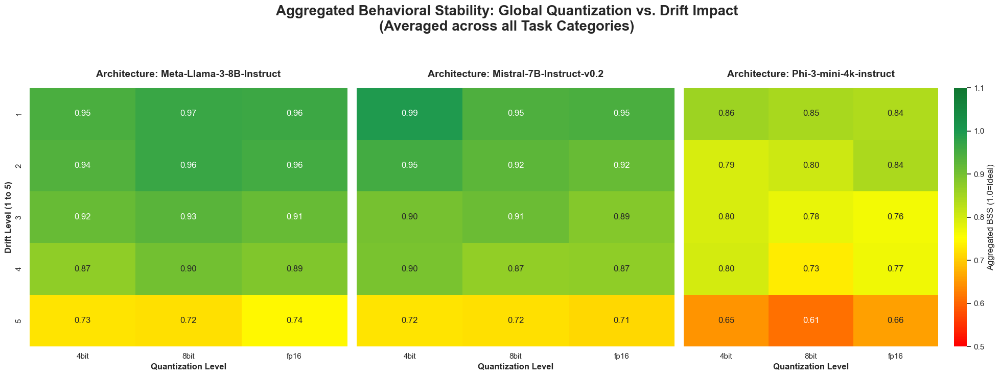

In [40]:
def plot_aggregated_quantization_bss_reports(base_bss_dir):
    """
    Generates a single aggregated report.
    Shows 1x3 subplots (one per Base Model) where BSS is averaged 
    across ALL categories (Classification, Logical, QnA, Reasoning).
    """
    base_path = Path(base_bss_dir)
    all_data = []

    # 1. Collect all data
    for json_file in base_path.rglob("bss_scores_with_stats.json"):
        model_string = json_file.parent.name
        try:
            with open(json_file, 'r') as f:
                data = json.load(f)
                
            for entry in data:
                drift_lvl = entry.get("Drift_Level")
                stats = entry.get("Category_Stats", {})
                for cat, stat_val in stats.items():
                    all_data.append({
                        "Model_String": model_string,
                        "Drift": drift_lvl,
                        "Category": cat,
                        "Mean_BSS": stat_val["Mean"]
                    })
        except Exception as e:
            print(f"⚠️ Error loading {model_string}: {e}")

    df_all = pd.DataFrame(all_data)
    if df_all.empty:
        print("❌ No BSS data found.")
        return

    # 2. Process Model Strings
    df_all['Base_Model'] = df_all['Model_String'].apply(lambda x: x.rsplit('_', 1)[0])
    df_all['Quantization'] = df_all['Model_String'].apply(lambda x: x.rsplit('_', 1)[1])

    # 3. AGGREGATE: Calculate Mean BSS across all categories
    df_agg = df_all.groupby(['Base_Model', 'Drift', 'Quantization'])['Mean_BSS'].mean().reset_index()

    # --- CUSTOM COLORMAP (0.4 to 1.1) ---
    # 1.0 is Green, above 1.0 is Black
    bss_colors = ["#FF0000", "#FFFF00", "#1a9850", "#004400", "#000000"]
    bss_cmap = mcolors.LinearSegmentedColormap.from_list("BSS_Custom", bss_colors)

    base_models = sorted(df_agg['Base_Model'].unique())
    quant_order = ['4bit', '8bit', 'fp16'] 

    # 4. Generate the Aggregated 1x3 Figure
    fig, axes = plt.subplots(1, len(base_models), figsize=(20, 7), sharey=True)
    if len(base_models) == 1: axes = [axes] 

    for i, base_model in enumerate(base_models):
        subset = df_agg[df_agg['Base_Model'] == base_model]
        
        # Pivot for Heatmap: Drift (Y) vs Quantization (X)
        pivot_mean = subset.pivot_table(index="Drift", columns="Quantization", values="Mean_BSS")
        
        # Ensure correct precision order
        available_quants = [q for q in quant_order if q in pivot_mean.columns]
        pivot_mean = pivot_mean[available_quants]
        
        # Plot Heatmap
        sns.heatmap(pivot_mean, annot=True, cmap=bss_cmap, center=1.0, 
                    vmin=0.5, vmax=1.1, fmt=".2f", ax=axes[i], 
                    cbar=(i == len(base_models) - 1), 
                    cbar_kws={'label': 'Aggregated BSS (1.0=Ideal)'})
        
        # Subplot Formatting
        axes[i].set_title(f"Architecture: {base_model}", fontweight='bold', fontsize=14, pad=15)
        axes[i].set_xlabel("Quantization Level", fontweight='bold')
        if i == 0:
            axes[i].set_ylabel("Drift Level (1 to 5)", fontweight='bold')
        else:
            axes[i].set_ylabel("")

    plt.suptitle("Aggregated Behavioral Stability: Global Quantization vs. Drift Impact\n(Averaged across all Task Categories)", 
                 fontsize=20, fontweight='bold', y=1.05)
    
    plt.tight_layout()
    plt.show()

# Run the aggregated analysis
plot_aggregated_quantization_bss_reports(r"../6_BSS_calculation/BSS")

# Statistical Significance Markers

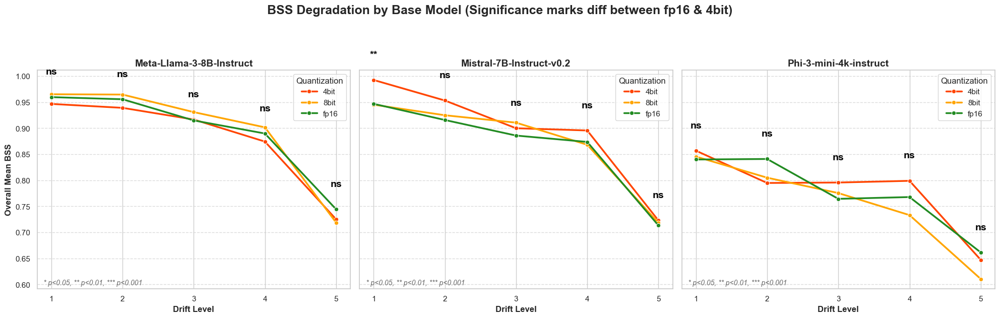

In [15]:


def plot_bss_with_significance_subplots(base_bss_dir):
    """
    Generates a 1x3 subplot grid for each Base Model showing overall Mean BSS vs Drift Level.
    Performs a paired t-test between 4-bit and fp16 prompt scores at each drift level
    and adds statistical significance markers (*, **, ***) to the graphs.
    """
    base_path = Path(base_bss_dir)
    all_scores = []

    # 1. Collect RAW prompt scores (needed for statistical testing)
    for json_file in base_path.rglob("bss_scores_with_stats.json"):
        model_string = json_file.parent.name
        try:
            with open(json_file, 'r') as f:
                data = json.load(f)
                
            base_model = model_string.rsplit('_', 1)[0]
            quant = model_string.rsplit('_', 1)[1]
                
            for entry in data:
                drift_lvl = entry.get("Drift_Level")
                # Extract individual prompt scores to calculate significance
                for prompt_name, score in entry.get("Scores", {}).items():
                    all_scores.append({
                        "Base_Model": base_model,
                        "Quantization": quant,
                        "Drift": drift_lvl,
                        "Prompt": prompt_name,
                        "Score": score
                    })
        except Exception as e:
            print(f"⚠️ Error loading {model_string}: {e}")

    df_scores = pd.DataFrame(all_scores)
    if df_scores.empty:
        print("❌ No prompt scores found for significance testing.")
        return

    base_models = sorted(df_scores['Base_Model'].unique())
    quant_order = ['4bit', '8bit', 'fp16']
    
    # Custom palette to keep colors consistent
    quant_colors = {'4bit': '#FF4500', '8bit': '#FFA500', 'fp16': '#228B22'} # Red/Orange, Orange, Green

    # 2. Create the 1x3 Subplot Grid
    # Using sharey=True so all models can be visually compared on the same vertical scale
    fig, axes = plt.subplots(1, len(base_models), figsize=(20, 6), sharey=True)
    
    # Ensure axes is iterable just in case there's only 1 base model found
    if len(base_models) == 1: 
        axes = [axes]

    for i, base_model in enumerate(base_models):
        ax = axes[i]
        subset = df_scores[df_scores['Base_Model'] == base_model]
        
        # Plot the average line for each quantization on the specific axis (ax=ax)
        sns.lineplot(
            data=subset, 
            x="Drift", 
            y="Score", 
            hue="Quantization", 
            hue_order=[q for q in quant_order if q in subset['Quantization'].unique()],
            palette=quant_colors,
            marker="o", 
            linewidth=2.5,
            errorbar=None, 
            ax=ax
        )
        
        # 3. Calculate and Annotate Statistical Significance (fp16 vs 4bit)
        # 3. Calculate and Annotate Statistical Significance (fp16 vs 4bit)
        drifts = sorted(subset['Drift'].unique())
        for drift in drifts:
            df_drift = subset[subset['Drift'] == drift]
            
            fp16_data = df_drift[df_drift['Quantization'] == 'fp16'][['Prompt', 'Score']]
            bit4_data = df_drift[df_drift['Quantization'] == '4bit'][['Prompt', 'Score']]
            
            # Merge on 'Prompt' to ensure we only compare exact pairs
            merged = pd.merge(fp16_data, bit4_data, on='Prompt', suffixes=('_fp16', '_4bit'))
            
            if len(merged) > 1: # Need at least 2 pairs to run a t-test
                stat, p_val = ttest_rel(merged['Score_fp16'], merged['Score_4bit'])
                
                if p_val < 0.001: sig_marker = "***"
                elif p_val < 0.01: sig_marker = "**"
                elif p_val < 0.05: sig_marker = "*"
                else: sig_marker = "ns"
                
                y_max = max(merged['Score_fp16'].mean(), merged['Score_4bit'].mean())
                
                # Plot text on the current axis
                axes[i].text(x=drift, y=y_max + 0.04, s=sig_marker, 
                             ha='center', va='bottom', fontsize=14, fontweight='bold', color='black')

        # 4. Formatting for each specific Subplot
        ax.set_title(f"{base_model}", fontsize=14, fontweight='bold')
        ax.set_xlabel("Drift Level", fontsize=12, fontweight='bold')
        ax.set_xticks(drifts)
        
        # Only set the Y-axis label on the far-left plot
        if i == 0:
            ax.set_ylabel("Overall Mean BSS", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
        
        # Legend management
        handles, labels = ax.get_legend_handles_labels()
        ax.legend(handles, labels, title="Quantization", loc='upper right')
        ax.text(0.02, 0.02, "* p<0.05, ** p<0.01, *** p<0.001", transform=ax.transAxes, fontsize=10, style='italic', color='dimgrey')
        
        ax.grid(axis='y', linestyle='--', alpha=0.7)

    # Global formatting
    plt.suptitle("BSS Degradation by Base Model (Significance marks diff between fp16 & 4bit)", fontsize=18, fontweight='bold', y=1.05)
    plt.tight_layout()
    plt.show()

# To run:
plot_bss_with_significance_subplots(r"../6_BSS_calculation/BSS")

# Interaction Effect Plot

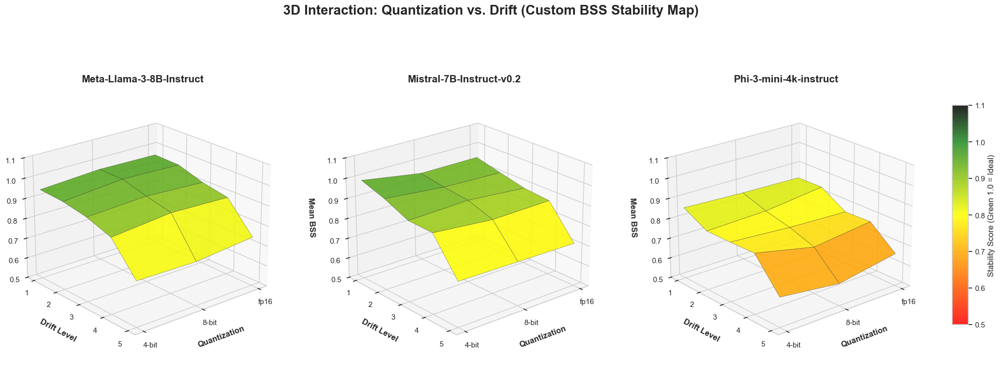

In [29]:
def plot_bss_3d_interaction(base_bss_dir):
    """
    Generates a 1x3 grid of 3D surface plots for each Base Model.
    Z-axis: 0.5 to 1.1
    Colormap: Red (Low) -> Yellow -> Green (1.0) -> Black (High)
    """
    base_path = Path(base_bss_dir)
    all_scores = []

    # 1. Collect RAW prompt scores
    for json_file in base_path.rglob("bss_scores_with_stats.json"):
        model_string = json_file.parent.name
        try:
            with open(json_file, 'r') as f:
                data = json.load(f)
                
            base_model = model_string.rsplit('_', 1)[0]
            quant = model_string.rsplit('_', 1)[1]
                
            for entry in data:
                drift_lvl = entry.get("Drift_Level")
                for prompt_name, score in entry.get("Scores", {}).items():
                    all_scores.append({
                        "Base_Model": base_model,
                        "Quantization": quant,
                        "Drift": drift_lvl,
                        "Score": score
                    })
        except Exception as e:
            print(f"⚠️ Error loading {model_string}: {e}")

    df_scores = pd.DataFrame(all_scores)
    if df_scores.empty:
        print("❌ No prompt scores found.")
        return

    # --- CUSTOM COLORMAP LOGIC (Scale: 0.5 to 1.1) ---
    # Normalizing 1.0 to the colormap position: (1.0 - 0.5) / (1.1 - 0.5) = 0.833
    colors = [
        (0.0, "#FF0000"),   # 0.5: Bright Red
        (0.5, "#FFFF00"),   # 0.8: Yellow
        (0.833, "#228B22"), # 1.0: Normal Green (Ideal)
        (1.0, "#000000")    # 1.1: Black (Outlier)
    ]
    custom_bss_cmap = mcolors.LinearSegmentedColormap.from_list("BSS_3D_Custom", colors)

    # Mapping Quantization to numerical values
    quant_mapping = {'4bit': 0, '8bit': 1, 'fp16': 2}
    df_scores['Quant_Num'] = df_scores['Quantization'].map(quant_mapping)

    base_models = sorted(df_scores['Base_Model'].unique())
    
    # 2. Setup the 1x3 3D Grid
    fig = plt.figure(figsize=(22, 9))

    for i, base_model in enumerate(base_models):
        ax = fig.add_subplot(1, len(base_models), i + 1, projection='3d')
        subset = df_scores[df_scores['Base_Model'] == base_model]
        
        # Aggregate to get Mean Score per (Drift, Quant)
        agg_df = subset.groupby(['Drift', 'Quant_Num'])['Score'].mean().reset_index()
        pivot = agg_df.pivot(index='Drift', columns='Quant_Num', values='Score')
        
        X, Y = np.meshgrid(pivot.columns, pivot.index)
        Z = pivot.values
        
        # 3. Plot the 3D Surface
        # vmin and vmax are locked to our custom map range
        surf = ax.plot_surface(X, Y, Z, cmap=custom_bss_cmap, edgecolor='#333333', 
                               linewidth=0.3, alpha=0.85, antialiased=True,
                               vmin=0.5, vmax=1.1)
        
        # 4. Format Axes
        ax.set_title(f"{base_model}", fontsize=15, fontweight='bold', pad=15)
        
        # X: Quantization
        ax.set_xticks([0, 1, 2])
        ax.set_xticklabels(['4-bit', '8-bit', 'fp16'])
        ax.set_xlabel('Quantization', fontweight='bold', labelpad=10)
        
        # Y: Drift
        ax.set_yticks([1, 2, 3, 4, 5])
        ax.set_ylabel('Drift Level', fontweight='bold', labelpad=10)
        ax.invert_yaxis() # Traditional view showing Drift 1 at the "back"
        
        # Z: BSS Score
        ax.set_zlim(0.5, 1.1)
        ax.set_zlabel('Mean BSS', fontweight='bold', labelpad=10)
        
        # Optimization: Set viewing angle to see the Green plateau and Red decay
        ax.view_init(elev=22, azim=230) 

    # 5. Global Legend (Colorbar)
    cbar_ax = fig.add_axes([0.93, 0.25, 0.015, 0.5]) 
    fig.colorbar(surf, cax=cbar_ax, label='Stability Score (Green 1.0 = Ideal)')
    
    plt.suptitle("3D Interaction: Quantization vs. Drift (Custom BSS Stability Map)", 
                 fontsize=20, fontweight='bold', y=0.98)
    
    plt.subplots_adjust(left=0.05, right=0.9, top=0.85, bottom=0.1)
    plt.show()

# To run:
plot_bss_3d_interaction(r"../6_BSS_calculation/BSS")

C:\Users\nitin\AppData\Local\Temp\ipykernel_5236\3838712826.py:88: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.92, 1])
C:\Users\nitin\AppData\Local\Temp\ipykernel_5236\3838712826.py:88: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.92, 1])


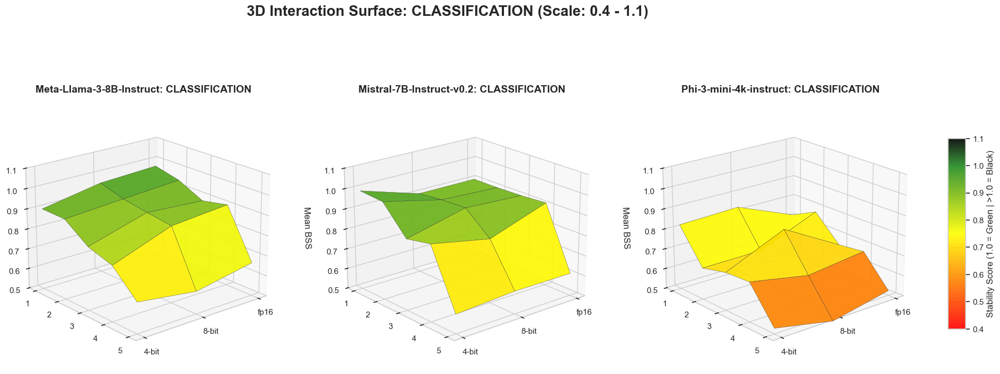

C:\Users\nitin\AppData\Local\Temp\ipykernel_5236\3838712826.py:88: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.92, 1])
C:\Users\nitin\AppData\Local\Temp\ipykernel_5236\3838712826.py:88: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.92, 1])


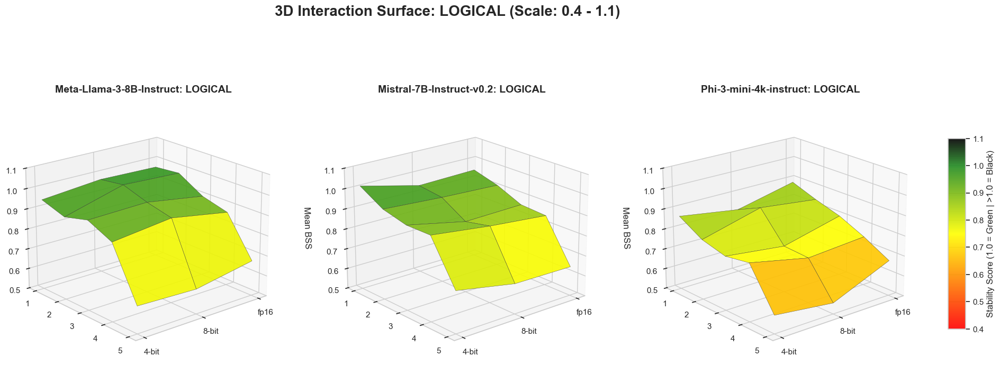

C:\Users\nitin\AppData\Local\Temp\ipykernel_5236\3838712826.py:88: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.92, 1])
C:\Users\nitin\AppData\Local\Temp\ipykernel_5236\3838712826.py:88: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.92, 1])


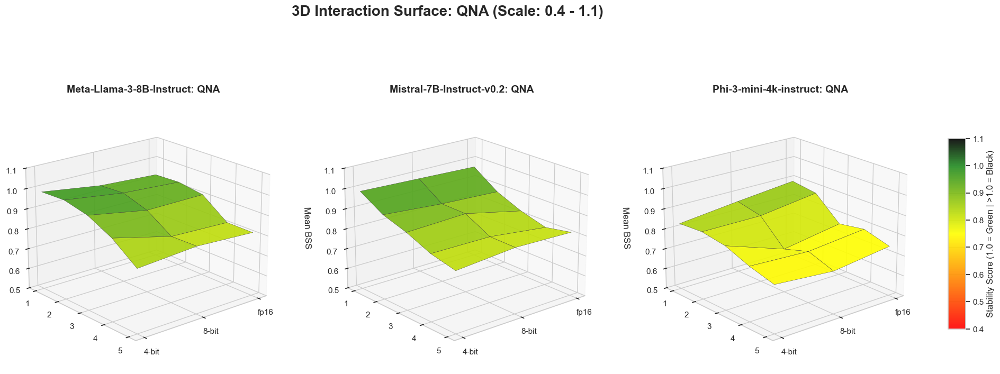

C:\Users\nitin\AppData\Local\Temp\ipykernel_5236\3838712826.py:88: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.92, 1])
C:\Users\nitin\AppData\Local\Temp\ipykernel_5236\3838712826.py:88: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.92, 1])


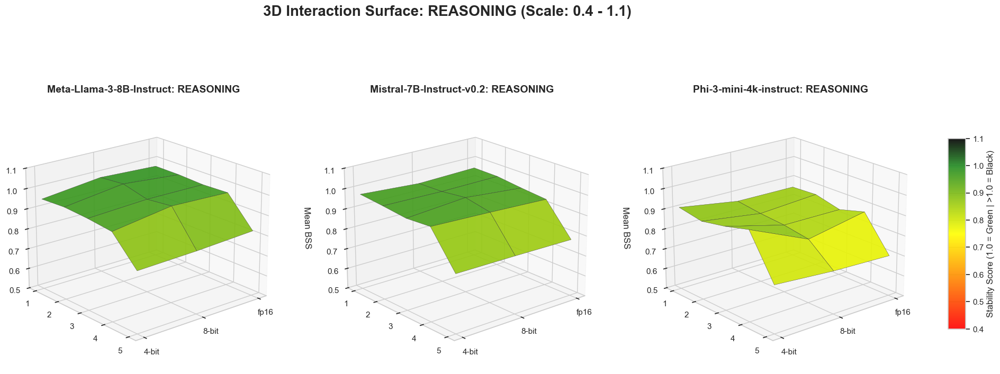

In [27]:
def plot_bss_3d_interaction_by_category(base_bss_dir):
    """
    Generates a 1x3 grid of 3D surface plots for each category.
    Z-axis: 0.4 to 1.1 (Ideal = 1.0)
    Colormap: Red (<0.7) -> Yellow (0.85) -> Green (1.0) -> Black (>1.0)
    """
    base_path = Path(base_bss_dir)
    all_scores = []

    # 1. Data Collection
    for json_file in base_path.rglob("bss_scores_with_stats.json"):
        model_string = json_file.parent.name
        try:
            with open(json_file, 'r') as f:
                data = json.load(f)
            
            parts = model_string.rsplit('_', 1)
            if len(parts) < 2: continue
            base_model, quant = parts[0], parts[1]
                
            for entry in data:
                drift_lvl = entry.get("Drift_Level")
                for key, score in entry.get("Scores", {}).items():
                    category = key.split(" (")[1].replace(")", "")
                    all_scores.append({
                        "Base_Model": base_model, "Quantization": quant,
                        "Drift": drift_lvl, "Category": category, "Score": score
                    })
        except Exception as e:
            print(f"⚠️ Error loading {model_string}: {e}")

    df_scores = pd.DataFrame(all_scores)
    
    # 2. Custom Colormap Logic (0.4 to 1.1)
    # To make 1.0 exactly Green, we define normalized positions:
    # 0.4 is 0.0 | 1.0 is ~0.857 | 1.1 is 1.0
    colors = [
        (0.0, "#FF0000"),  # 0.4: Red
        (0.5, "#FFFF00"),  # 0.75: Yellow
        (0.857, "#228B22"),# 1.0: Green (Ideal)
        (1.0, "#000000")   # 1.1: Black
    ]
    custom_bss_cmap = mcolors.LinearSegmentedColormap.from_list("BSS_Z_Scale", colors)

    base_models = sorted(df_scores['Base_Model'].unique())
    categories = sorted(df_scores['Category'].unique())
    quant_mapping = {'4bit': 0, '8bit': 1, 'fp16': 2}
    df_scores['Quant_Num'] = df_scores['Quantization'].map(quant_mapping)

    # 3. Plotting per Category
    for cat in categories:
        fig = plt.figure(figsize=(22, 9))
        cat_df = df_scores[df_scores['Category'] == cat]
        
        for i, base_model in enumerate(base_models):
            ax = fig.add_subplot(1, 3, i + 1, projection='3d')
            subset = cat_df[cat_df['Base_Model'] == base_model]
            
            agg_df = subset.groupby(['Drift', 'Quant_Num'])['Score'].mean().reset_index()
            pivot = agg_df.pivot(index='Drift', columns='Quant_Num', values='Score')
            X, Y = np.meshgrid(pivot.columns, pivot.index)
            Z = pivot.values
            
            # Surface Plot with new limits
            surf = ax.plot_surface(X, Y, Z, cmap=custom_bss_cmap, edgecolor='#333333', 
                                   linewidth=0.3, alpha=0.9, antialiased=True,
                                   vmin=0.4, vmax=1.1)
            
            # Axis Formatting
            ax.set_title(f"{base_model}: {cat.upper()}", fontsize=14, fontweight='bold', pad=15)
            ax.set_xticks([0, 1, 2]); ax.set_xticklabels(['4-bit', '8-bit', 'fp16'])
            ax.set_yticks([1, 2, 3, 4, 5])
            ax.invert_yaxis()
            
            # --- UPDATED Z-AXIS LIMIT ---
            ax.set_zlim(0.5, 1.1) 
            ax.set_zlabel('Mean BSS', labelpad=10)
            
            ax.view_init(elev=20, azim=230)

        # Global Colorbar
        cbar_ax = fig.add_axes([0.93, 0.3, 0.015, 0.4])
        fig.colorbar(surf, cax=cbar_ax, label='Stability Score (1.0 = Green | >1.0 = Black)')
        
        plt.suptitle(f"3D Interaction Surface: {cat.upper()} (Scale: 0.4 - 1.1)", 
                     fontsize=20, fontweight='bold', y=0.98)
        
        plt.tight_layout(rect=[0, 0, 0.92, 1])
        plt.show()

# Run the visualization
plot_bss_3d_interaction_by_category(r"../6_BSS_calculation/BSS")

# Quantization Gap Analysis

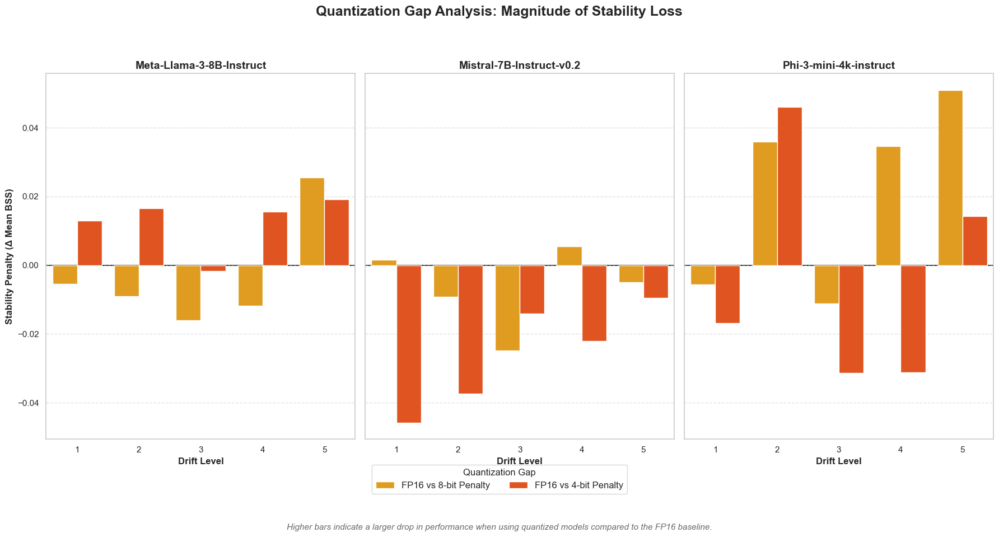

In [30]:
def plot_quantization_gap(base_bss_dir):
    """
    Generates a 1x3 grid of Bar Charts showing the Quantization Gap.
    Gap = BSS(fp16) - BSS(quantized). 
    A larger positive bar means a higher stability penalty due to quantization.
    """
    base_path = Path(base_bss_dir)
    all_data = []

    # 1. Collect Data
    for json_file in base_path.rglob("bss_scores_with_stats.json"):
        model_string = json_file.parent.name
        try:
            with open(json_file, 'r') as f:
                data = json.load(f)
                
            base_model = model_string.rsplit('_', 1)[0]
            quant = model_string.rsplit('_', 1)[1]
                
            for entry in data:
                drift_lvl = entry.get("Drift_Level")
                # Calculate the overall mean BSS for this drift level
                scores = list(entry.get("Scores", {}).values())
                if scores:
                    mean_bss = sum(scores) / len(scores)
                    all_data.append({
                        "Base_Model": base_model,
                        "Quantization": quant,
                        "Drift": drift_lvl,
                        "Mean_BSS": mean_bss
                    })
        except Exception as e:
            print(f"⚠️ Error loading {model_string}: {e}")

    df_all = pd.DataFrame(all_data)
    if df_all.empty:
        print("❌ No data found.")
        return

    # 2. Pivot the data to calculate the Gaps
    # We want columns for 4bit, 8bit, and fp16 to easily subtract them
    pivot_df = df_all.pivot_table(index=['Base_Model', 'Drift'], 
                                  columns='Quantization', 
                                  values='Mean_BSS').reset_index()

    # Calculate the exact penalties (Gaps)
    # If fp16 is 1.0 and 4bit is 0.6, the gap is +0.40 (A 0.40 penalty for using 4bit)
    if 'fp16' in pivot_df.columns and '4bit' in pivot_df.columns:
        pivot_df['Gap_4bit'] = pivot_df['fp16'] - pivot_df['4bit']
    if 'fp16' in pivot_df.columns and '8bit' in pivot_df.columns:
        pivot_df['Gap_8bit'] = pivot_df['fp16'] - pivot_df['8bit']

    # Melt back into a long format for Seaborn plotting
    melt_cols = ['Base_Model', 'Drift']
    val_vars = []
    if 'Gap_8bit' in pivot_df.columns: val_vars.append('Gap_8bit')
    if 'Gap_4bit' in pivot_df.columns: val_vars.append('Gap_4bit')
    
    gap_df = pd.melt(pivot_df, id_vars=melt_cols, value_vars=val_vars, 
                     var_name='Gap_Type', value_name='BSS_Penalty')

    # Rename for cleaner legends
    gap_df['Gap_Type'] = gap_df['Gap_Type'].replace({
        'Gap_4bit': 'FP16 vs 4-bit Penalty',
        'Gap_8bit': 'FP16 vs 8-bit Penalty'
    })

    base_models = sorted(gap_df['Base_Model'].unique())
    gap_colors = {'FP16 vs 8-bit Penalty': '#FFA500', 'FP16 vs 4-bit Penalty': '#FF4500'}

    # 3. Setup the 1x3 Grid
    fig, axes = plt.subplots(1, len(base_models), figsize=(18, 8), sharey=True)
    if len(base_models) == 1: axes = [axes]

    # 4. Generate the Grouped Bar Charts
    for i, base_model in enumerate(base_models):
        subset = gap_df[gap_df['Base_Model'] == base_model]
        drifts = sorted(subset['Drift'].unique())
        
        sns.barplot(
            data=subset, 
            x="Drift", 
            y="BSS_Penalty", 
            hue="Gap_Type",
            palette=gap_colors,
            ax=axes[i]
        )

        # Draw a baseline at 0 (No difference between FP16 and Quantized)
        axes[i].axhline(0, color='black', linewidth=1.2, zorder=0)

        # Formatting
        axes[i].set_title(f"{base_model}", fontsize=14, fontweight='bold')
        axes[i].set_xlabel("Drift Level", fontsize=12, fontweight='bold')
        axes[i].grid(axis='y', linestyle='--', alpha=0.6)
        
        if i == 0:
            axes[i].set_ylabel("Stability Penalty (Δ Mean BSS)", fontsize=12, fontweight='bold')
        else:
            axes[i].set_ylabel("")
            
        axes[i].get_legend().remove()

    # 5. Global Legend and Titles
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, title="Quantization Gap", loc='lower center', 
               ncol=2, bbox_to_anchor=(0.5, -0.05), fontsize=12, title_fontsize=12)
    
    plt.suptitle("Quantization Gap Analysis: Magnitude of Stability Loss", 
                 fontsize=18, fontweight='bold', y=1.05)
    
    # Add a subtitle explaining how to read it
    fig.text(0.5, -0.12, "Higher bars indicate a larger drop in performance when using quantized models compared to the FP16 baseline.", 
             ha='center', fontsize=11, style='italic', color='dimgrey')

    plt.tight_layout()
    plt.show()

# To run:
plot_quantization_gap(r"../6_BSS_calculation/BSS")